# Predictive Modeling in Healthcare: Multi-Class Classification of Medical Test Results using ML and DL Techniques

# Context:
This synthetic healthcare dataset has been created to serve as a valuable resource for data science, machine learning, and data analysis enthusiasts. It is designed to mimic real-world healthcare data, enabling users to practice, develop, and showcase their data manipulation and analysis skills in the context of the healthcare industry.

## Dataset Information:
Each column provides specific information about the patient, their admission, and the healthcare services provided, making this dataset suitable for various data analysis and modeling tasks in the healthcare domain. Here's a brief explanation of each column in the dataset -

**Name:** This column represents the name of the patient associated with the healthcare record.
**Age:** The age of the patient at the time of admission, expressed in years.
**Gender:** Indicates the gender of the patient, either "Male" or "Female."
**Blood Type:** The patient's blood type, which can be one of the common blood types (e.g., "A+", "O-", etc.).
**Medical Condition:** This column specifies the primary medical condition or diagnosis associated with the patient, such as "Diabetes," "Hypertension," "Asthma," and more.
**Date of Admission:** The date on which the patient was admitted to the healthcare facility.
**Doctor:** The name of the doctor responsible for the patient's care during their admission.
**Hospital:** Identifies the healthcare facility or hospital where the patient was admitted.
**Insurance Provider:** This column indicates the patient's insurance provider, which can be one of several options, including "Aetna," "Blue Cross," "Cigna," "UnitedHealthcare," and "Medicare."
**Billing Amount:** The amount of money billed for the patient's healthcare services during their admission. This is expressed as a floating-point number.
**Room Number:** The room number where the patient was accommodated during their admission.
**Admission Type:** Specifies the type of admission, which can be "Emergency," "Elective," or "Urgent," reflecting the circumstances of the admission.
**Discharge Date:** The date on which the patient was discharged from the healthcare facility, based on the admission date and a random number of days within a realistic range.
**Medication:** Identifies a medication prescribed or administered to the patient during their admission. Examples include "Aspirin," "Ibuprofen," "Penicillin," "Paracetamol," and "Lipitor."
**Test Results:** Describes the results of a medical test conducted during the patient's admission. Possible values include "Normal," "Abnormal," or "Inconclusive," indicating the outcome of the test.

### Usage Scenarios:

This dataset can be utilized for a wide range of purposes, including:

* Healthcare Predictive Models: Developing and testing healthcare predictive models.
* Data Cleaning and Transformation: Practicing data cleaning, transformation, and analysis techniques.
* Data Visualisation: Creating data visualizations to gain insights into healthcare trends.
* Healthcare Analytics Education: Learning and teaching data science and machine learning concepts in a healthcare context.
* Test Results: You can treat it as a Multi-Class Classification Problem and solve it for Test Results which contains 3    categories(Normal, Abnormal, and Inconclusive).


#### Multi-Class Classification Problem:
The primary objective is to classify the Test Results into one of the following three categories:
 1. Normal
 2. Abnormal
 3. Incoclusive

By using this features such as Age, Medical Condition, Admission Type, Medication, etc., you can multi-class classification model (Random Forest, Decision Trees, Neural Networks) to predict the outcomes.


In [1]:
import pandas as pd
import os 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings 
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv("/Users/edith/Downloads/healthcare_dataset.csv")
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal


In [3]:
df.shape

(55500, 15)

In [4]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [5]:
df['Test Results'].value_counts()

Test Results
Abnormal        18627
Normal          18517
Inconclusive    18356
Name: count, dtype: int64

In [6]:
df.duplicated().sum()

534

In [7]:
# Data Cleaning

df = df.drop_duplicates()

In [8]:
df.duplicated().sum()

0

In [10]:
df.isnull().sum() #null values as columnwise using aggregation function

Name                  0
Age                   0
Gender                0
Blood Type            0
Medical Condition     0
Date of Admission     0
Doctor                0
Hospital              0
Insurance Provider    0
Billing Amount        0
Room Number           0
Admission Type        0
Discharge Date        0
Medication            0
Test Results          0
dtype: int64

In [16]:
df.isnull().sum().sum() #null values in comnsolidated data sets

0

In [21]:
df.describe() # statistical analysis

,Age,Billing Amount,Room Number
count,54966.000000,54966.000000,54966.000000
mean,51.535185,25544.306284,301.124404
std,19.605661,14208.409711,115.223143
min,13.000000,-2008.492140,101.000000
25%,35.000000,13243.718641,202.000000
50%,52.000000,25542.749145,302.000000
75%,68.000000,37819.858159,401.000000
max,89.000000,52764.276736,500.000000


In [23]:
df.info() # Checking the different data types and non null counting

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [25]:
df.nunique() # Unique elements of the data for each column wise

Name                  49992
Age                      77
Gender                    2
Blood Type                8
Medical Condition         6
Date of Admission      1827
Doctor                40341
Hospital              39876
Insurance Provider        5
Billing Amount        50000
Room Number             400
Admission Type            3
Discharge Date         1856
Medication                5
Test Results              3
dtype: int64

In [27]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object Type Columns : " + object_columns+ " ")
numerical_columns = df.select_dtypes(include=['int64','float64']).columns
print("Numerical Type Columns : " + numerical_columns)

Index(['Object Type Columns : Name ', 'Object Type Columns : Gender ',
       'Object Type Columns : Blood Type ',
       'Object Type Columns : Medical Condition ',
       'Object Type Columns : Date of Admission ',
       'Object Type Columns : Doctor ', 'Object Type Columns : Hospital ',
       'Object Type Columns : Insurance Provider ',
       'Object Type Columns : Admission Type ',
       'Object Type Columns : Discharge Date ',
       'Object Type Columns : Medication ',
       'Object Type Columns : Test Results '],
      dtype='object')
Index(['Numerical Type Columns : Age',
       'Numerical Type Columns : Billing Amount',
       'Numerical Type Columns : Room Number'],
      dtype='object')


In [29]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []


    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)
    return categorical_features, non_categorical_features, discrete_features, continuous_features
                
                                

In [31]:
categorical, non_categorical, discrete, continuous = classify_features(df)
                

In [33]:
print("Categorical Features: ", categorical)
print("*****************")
print("Non Categorical Features: ", non_categorical)
print("*****************")
print("Discrete Features: ", discrete)
print("*****************")
print("Continuous Features: ", continuous)
print("*****************")

Categorical Features:  ['Gender', 'Blood Type', 'Medical Condition', 'Insurance Provider', 'Admission Type', 'Medication', 'Test Results']
*****************
Non Categorical Features:  ['Name', 'Date of Admission', 'Doctor', 'Hospital', 'Discharge Date']
*****************
Discrete Features:  []
*****************
Continuous Features:  ['Age', 'Billing Amount', 'Room Number']
*****************


In [35]:
for i in categorical:
    print(i)
    print(df[i].unique())
    print()

Gender
['Male' 'Female']

Blood Type
['B-' 'A+' 'A-' 'O+' 'AB+' 'AB-' 'B+' 'O-']

Medical Condition
['Cancer' 'Obesity' 'Diabetes' 'Asthma' 'Hypertension' 'Arthritis']

Insurance Provider
['Blue Cross' 'Medicare' 'Aetna' 'UnitedHealthcare' 'Cigna']

Admission Type
['Urgent' 'Emergency' 'Elective']

Medication
['Paracetamol' 'Ibuprofen' 'Aspirin' 'Penicillin' 'Lipitor']

Test Results
['Normal' 'Inconclusive' 'Abnormal']



In [37]:
for i in categorical:
    print(i)
    print(df[i].value_counts())
    print()

# Categorising categorical data for the various counts to visualise the data using different plots

Gender
Gender
Male      27496
Female    27470
Name: count, dtype: int64

Blood Type
Blood Type
A-     6898
A+     6896
B+     6885
AB+    6882
AB-    6874
B-     6872
O+     6855
O-     6804
Name: count, dtype: int64

Medical Condition
Medical Condition
Arthritis       9218
Diabetes        9216
Hypertension    9151
Obesity         9146
Cancer          9140
Asthma          9095
Name: count, dtype: int64

Insurance Provider
Insurance Provider
Cigna               11139
Medicare            11039
UnitedHealthcare    11014
Blue Cross          10952
Aetna               10822
Name: count, dtype: int64

Admission Type
Admission Type
Elective     18473
Urgent       18391
Emergency    18102
Name: count, dtype: int64

Medication
Medication
Lipitor        11038
Ibuprofen      11023
Aspirin        10984
Paracetamol    10965
Penicillin     10956
Name: count, dtype: int64

Test Results
Test Results
Abnormal        18437
Normal          18331
Inconclusive    18198
Name: count, dtype: int64



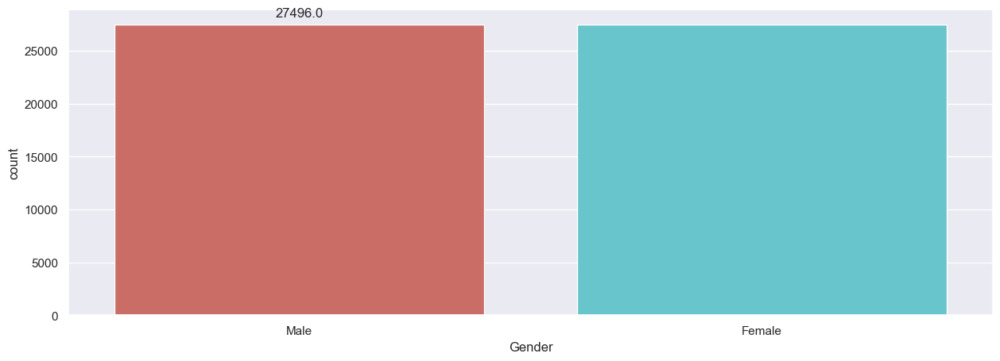

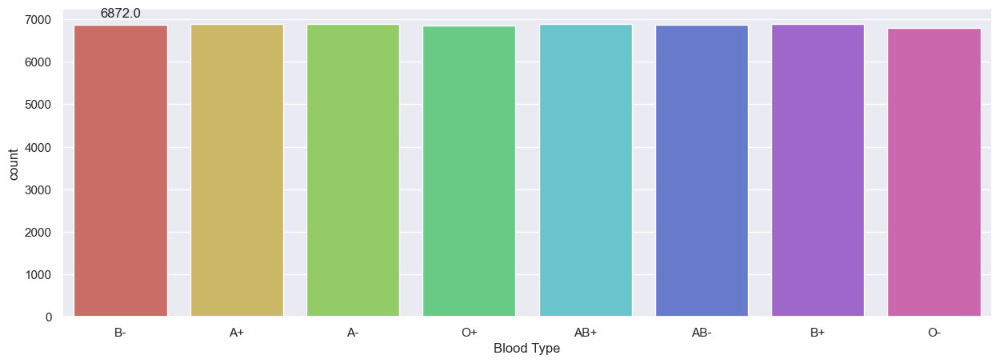

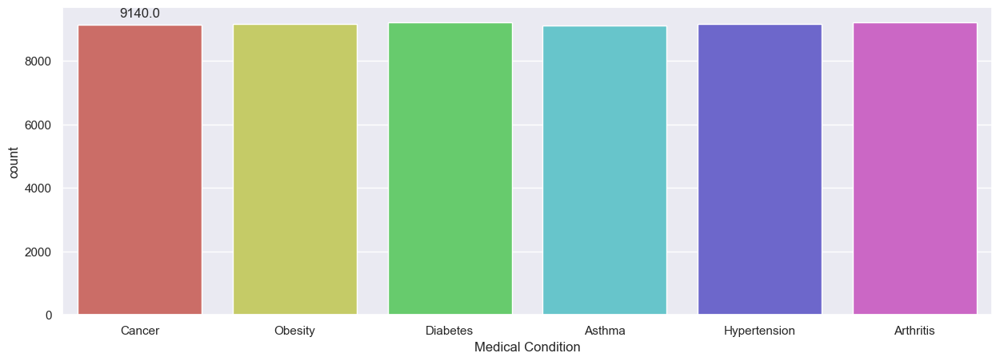

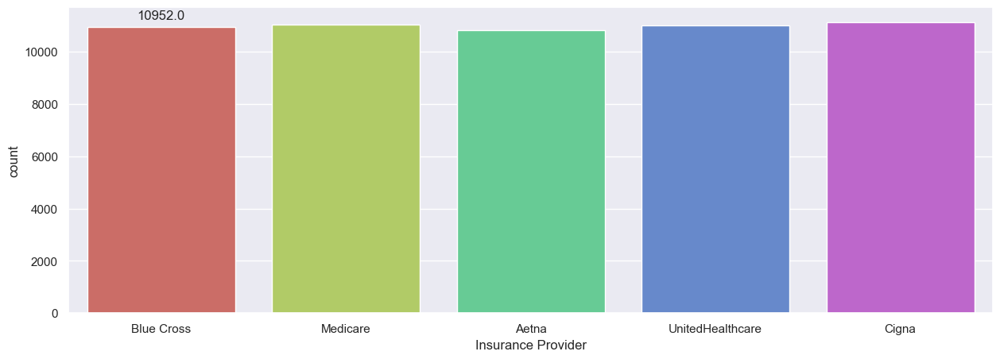

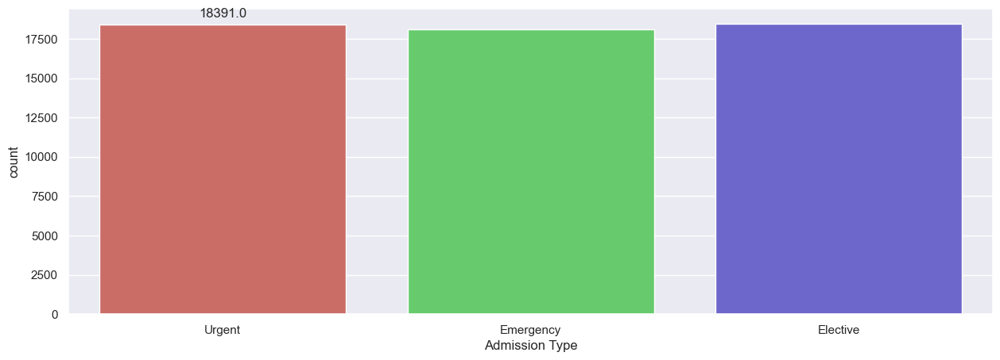

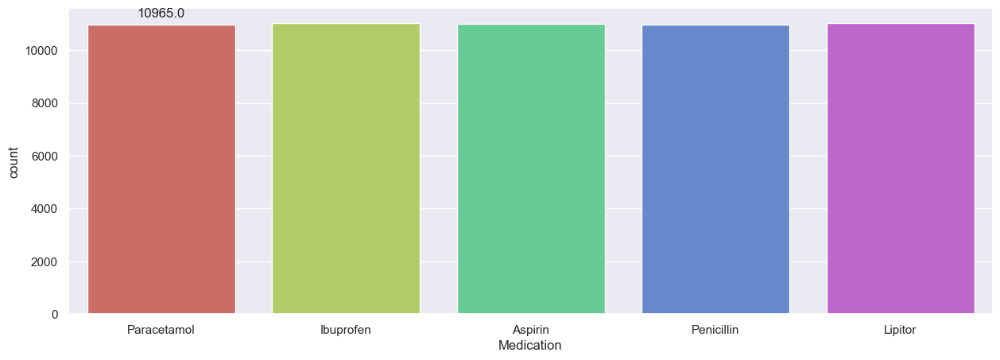

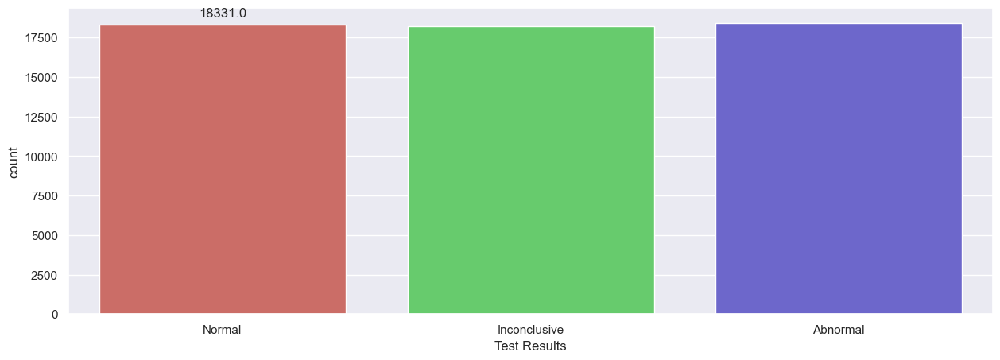

In [39]:
for i in categorical:
    plt.figure(figsize=(15,5))
    ax = sns.countplot(x=i, data=df, palette='hls')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f"{height}", 
                    xy = (p.get_x() + p.get_width() / 2, height), 
                    xytext = (0,10), 
                    textcoords = "offset points" ,
                    ha="center", va="center")
        plt.show()
        # Show the counts of observations in each categorical bin using bars. 
        # A count plot can be thought of as a histogram across a categorical, instead of quantitative, variable.

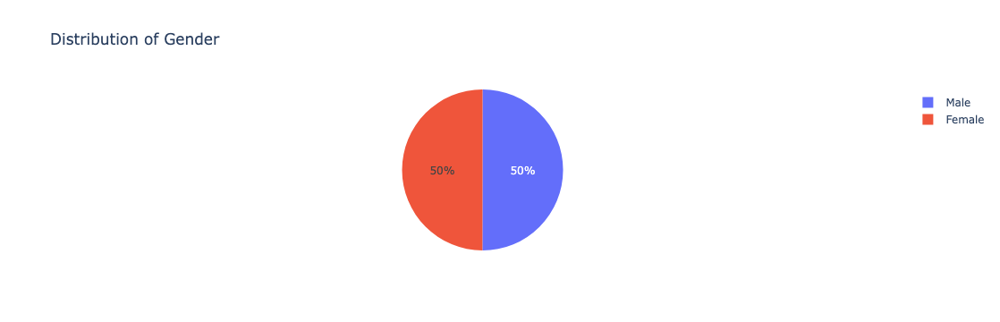

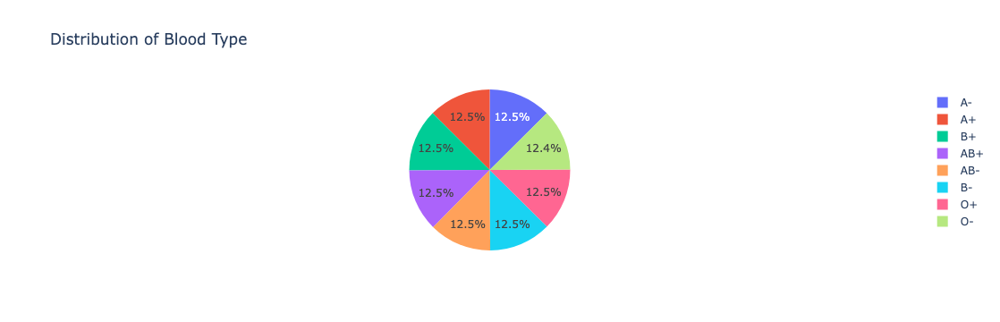

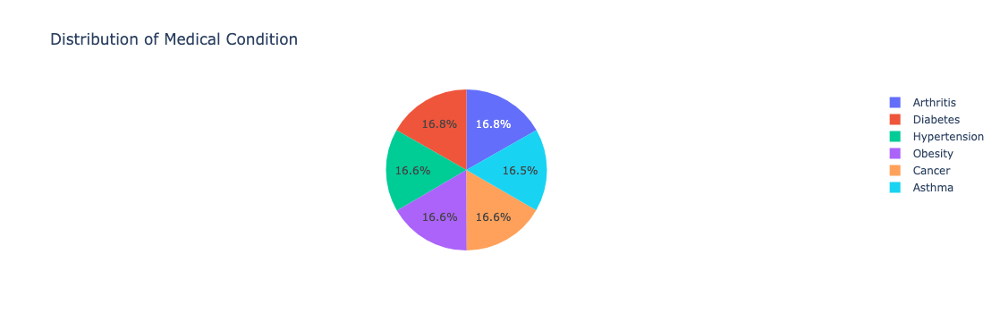

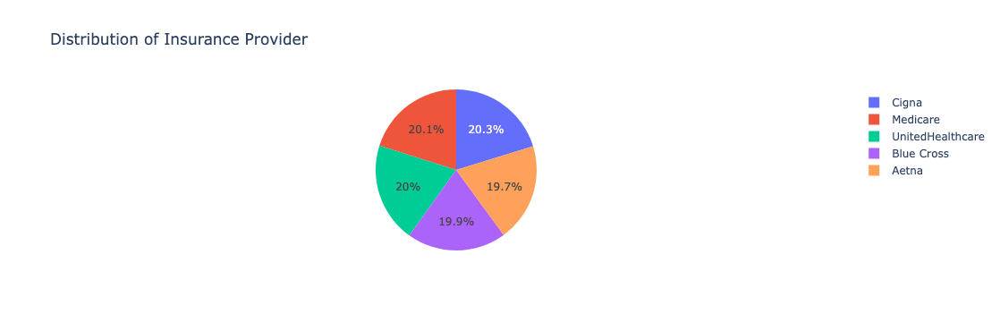

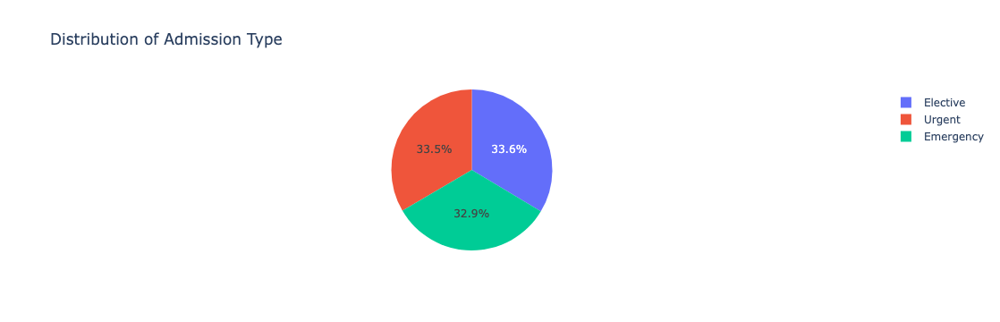

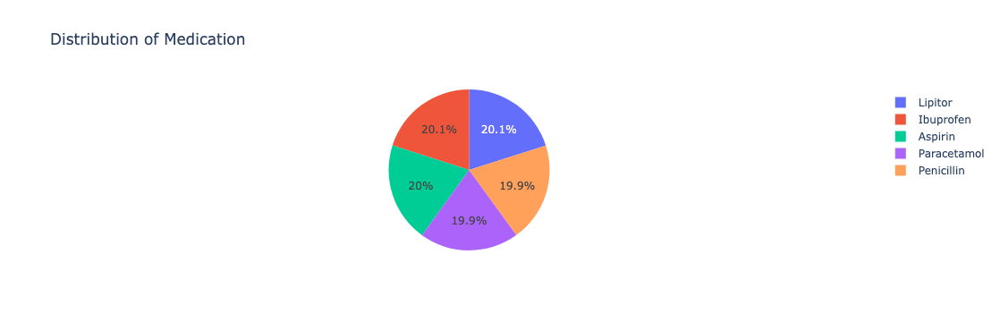

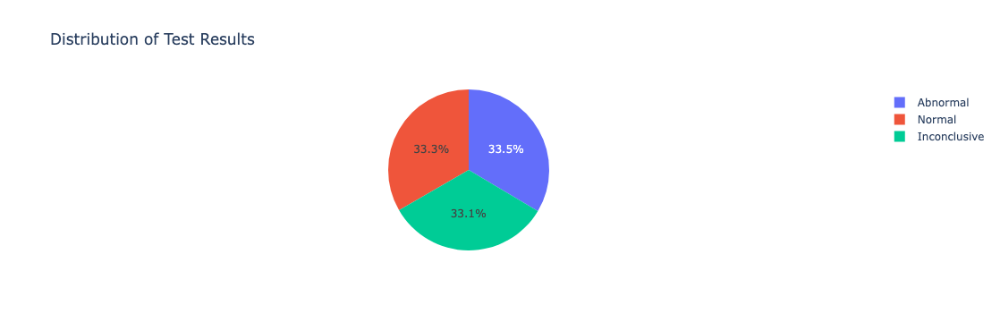

In [40]:
import plotly.express as px
for i in categorical:
    counts = df[i].value_counts()
    fig = px.pie(counts, values=counts.values, names=counts.index, title=f"Distribution of {i}")
    fig.show()

# A Pie Chart is a circular statistical plot that can display only one series of data. 
# The area of the chart is the total percentage of the given data. 
# Pie charts in Python are widely used in business presentations, reports, and dashboards due to their simplicity and effectiveness in displaying data distributions.

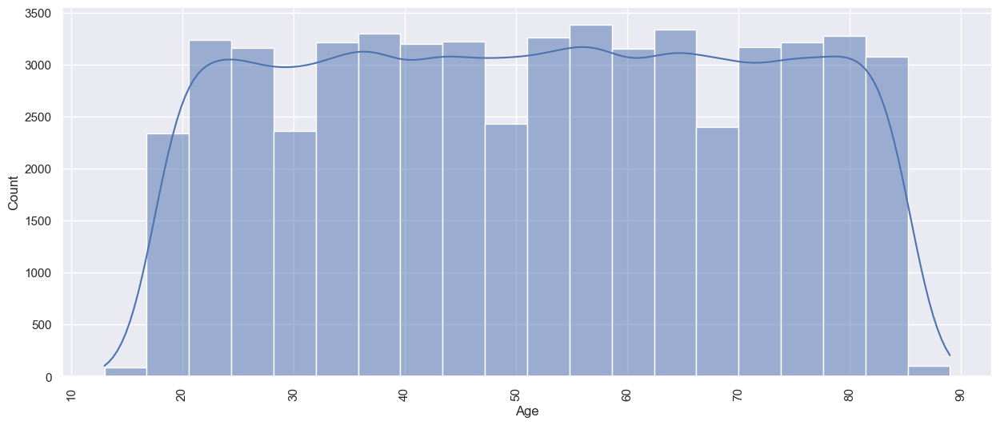

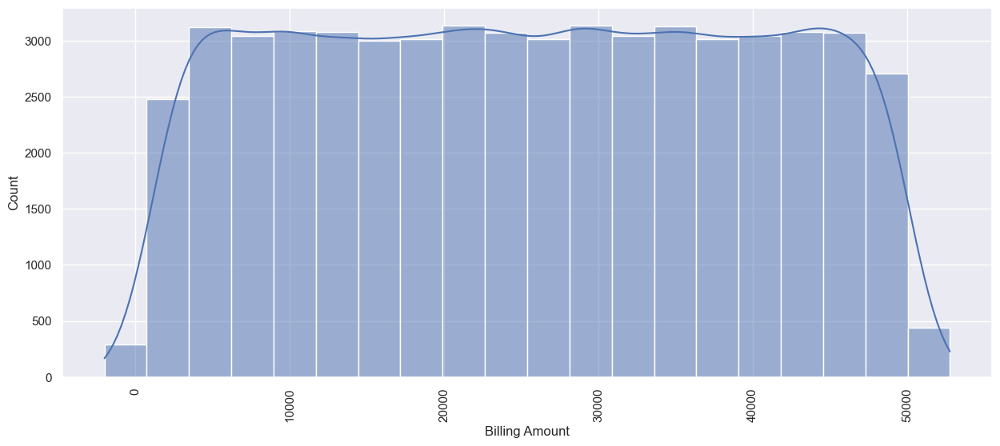

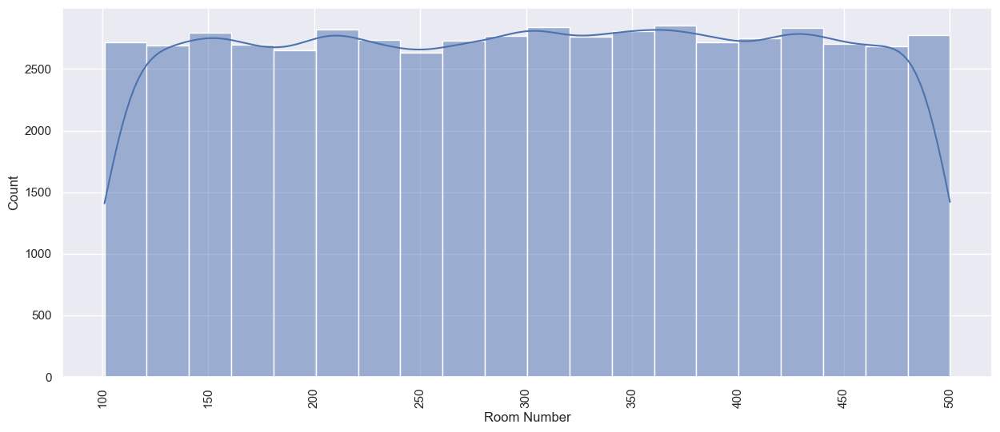

In [41]:
for i in continuous:
    plt.figure(figsize = (15,6))
    sns.histplot(df[i], bins= 20, kde=True, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

# Histograms provide a clear visual representation of the distribution of a numerical dataset. 
# You can easily see the frequency of values within specific ranges (bins).

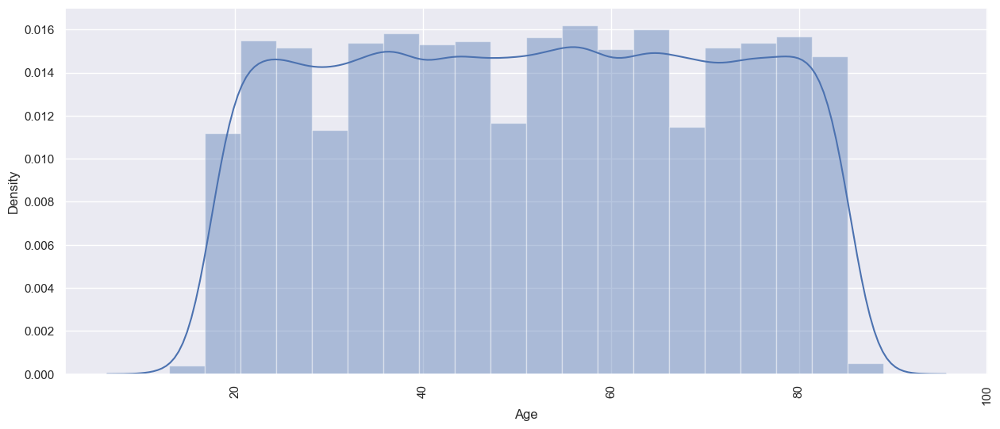

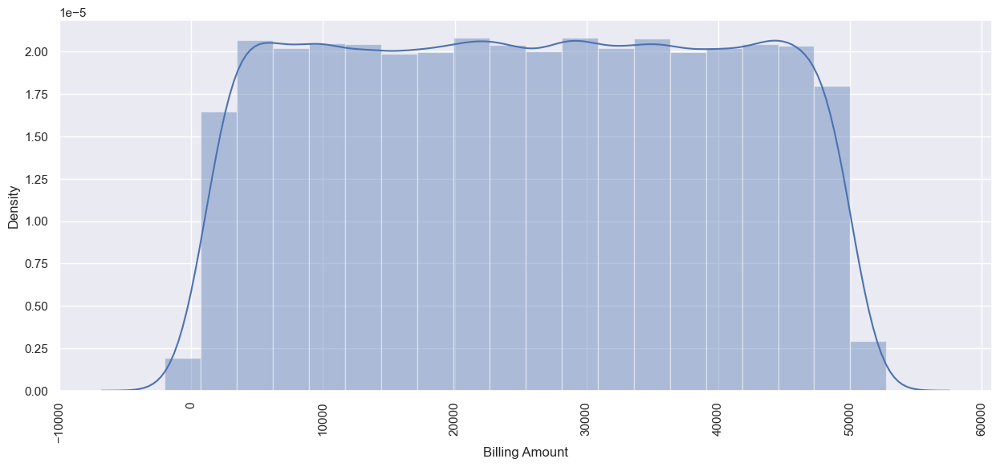

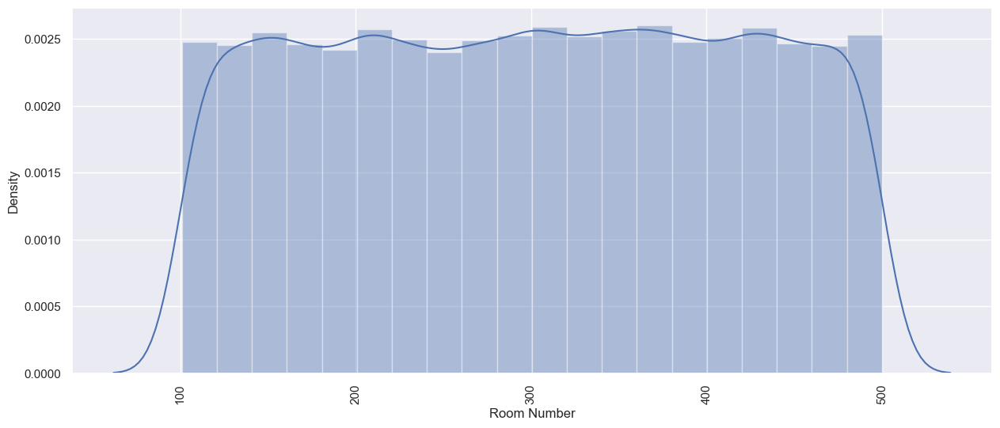

In [42]:
for i in continuous:
    plt.figure(figsize = (15,6))
    sns.distplot(df[i], bins= 20, kde=True)
    plt.xticks(rotation=90)
    plt.show()

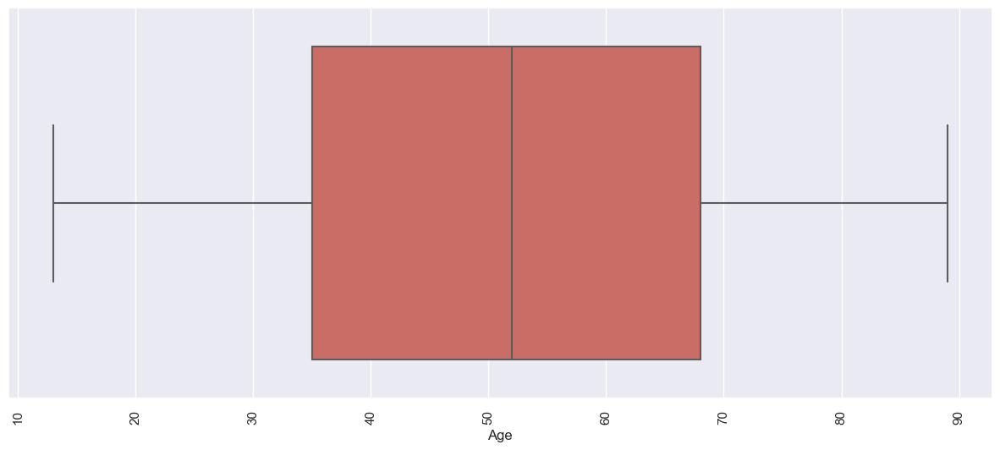

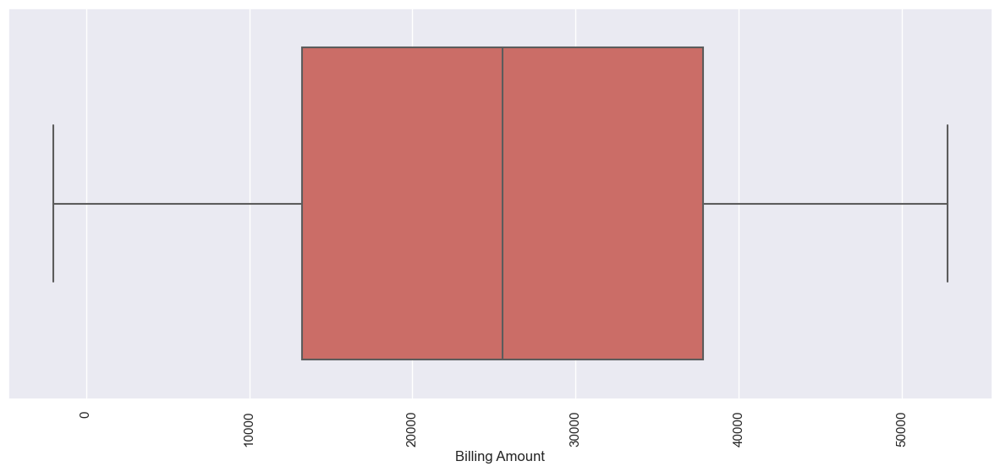

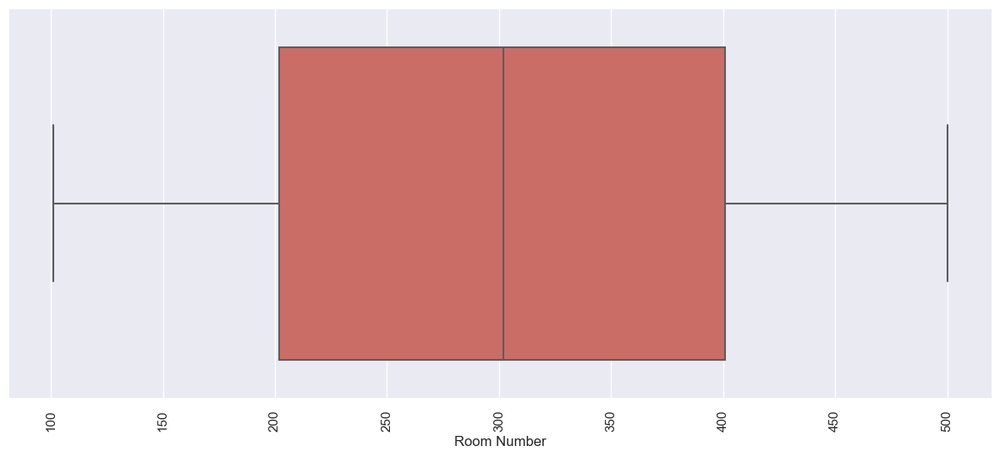

In [43]:
for i in continuous:
    plt.figure(figsize = (15,6))
    sns.boxplot(x=i, data= df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

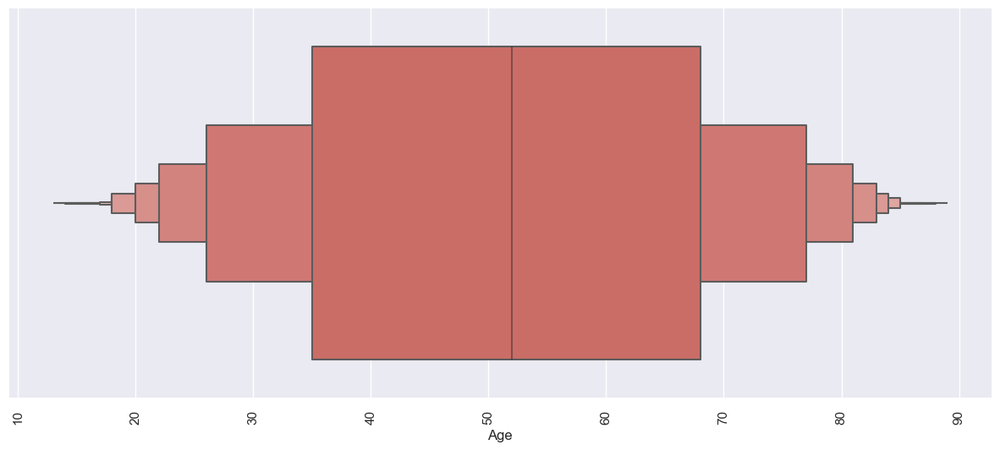

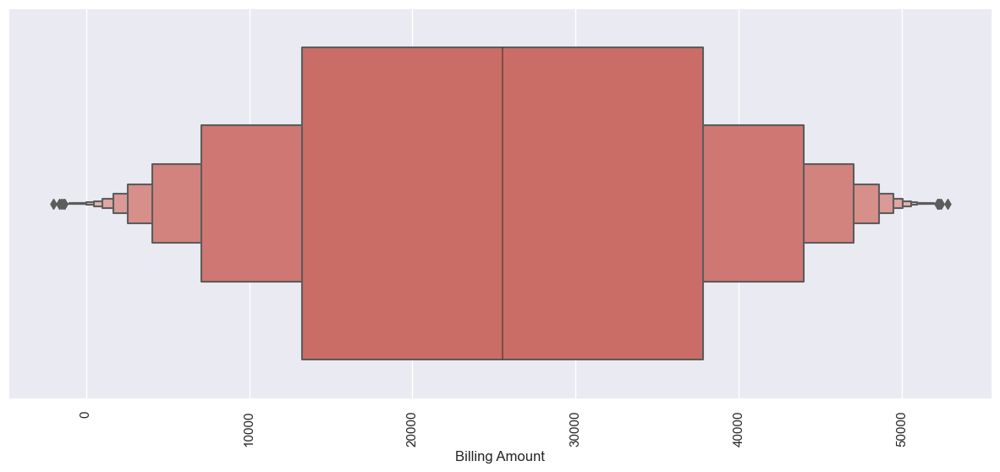

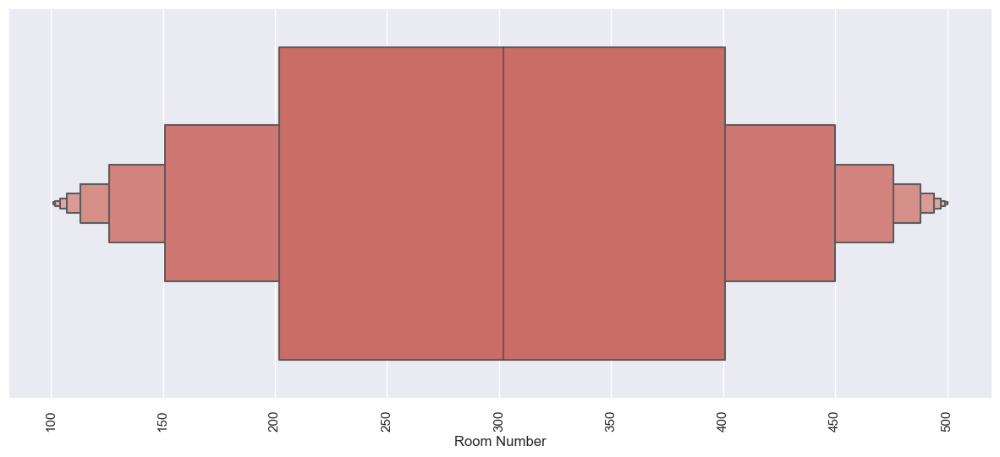

In [45]:



for i in continuous:
    plt.figure(figsize = (15,6))
    sns.boxenplot(x=i, data= df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

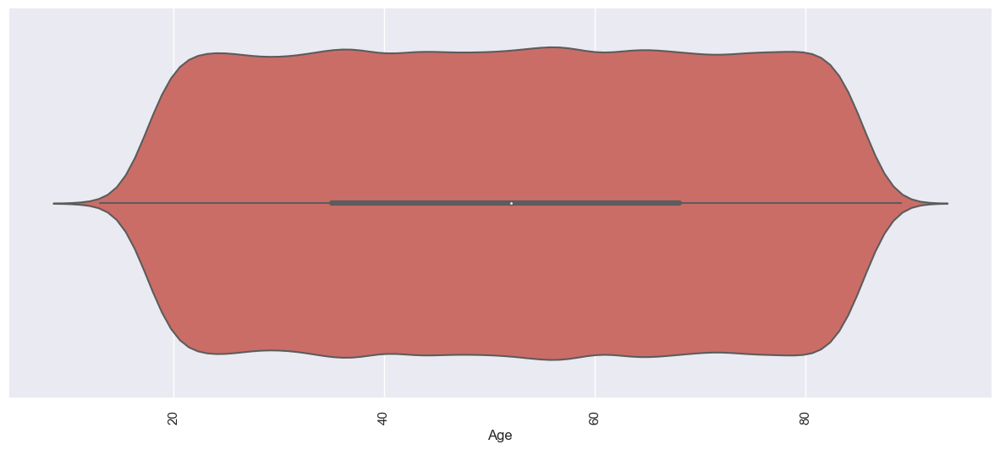

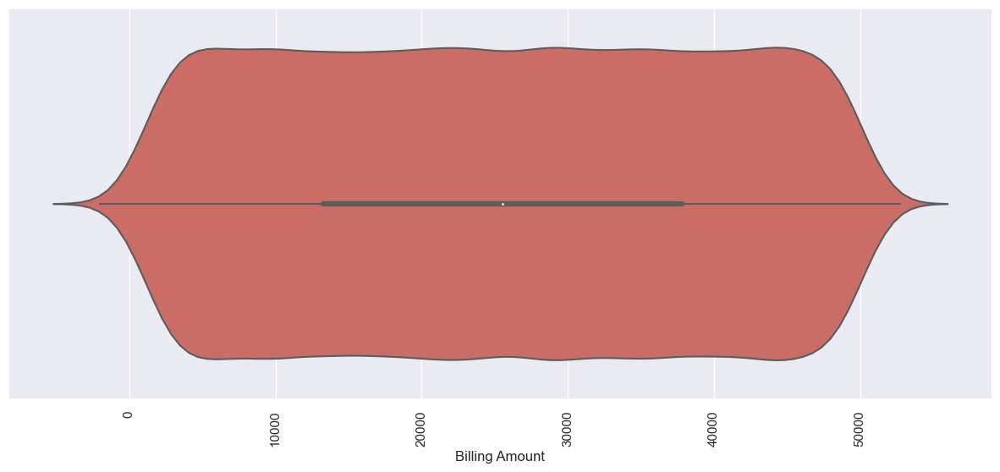

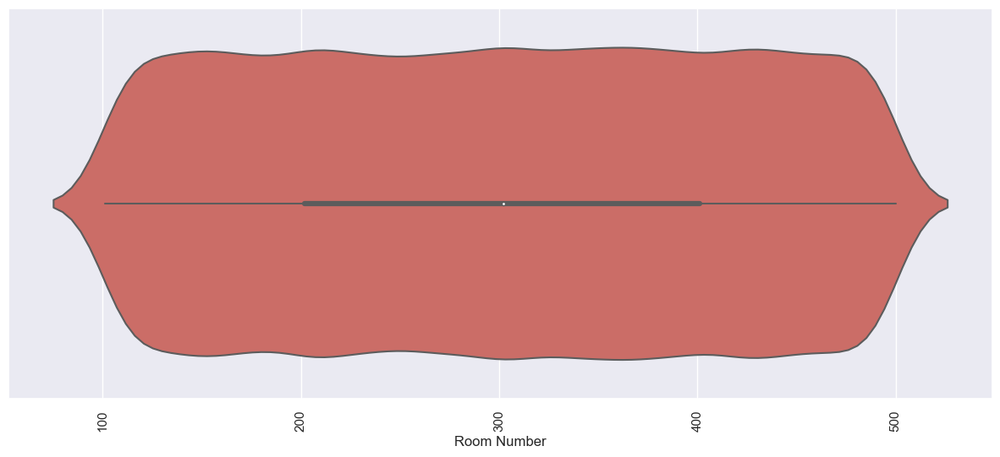

In [46]:
for i in continuous:
    plt.figure(figsize = (15,6))
    sns.violinplot(x=i, data= df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

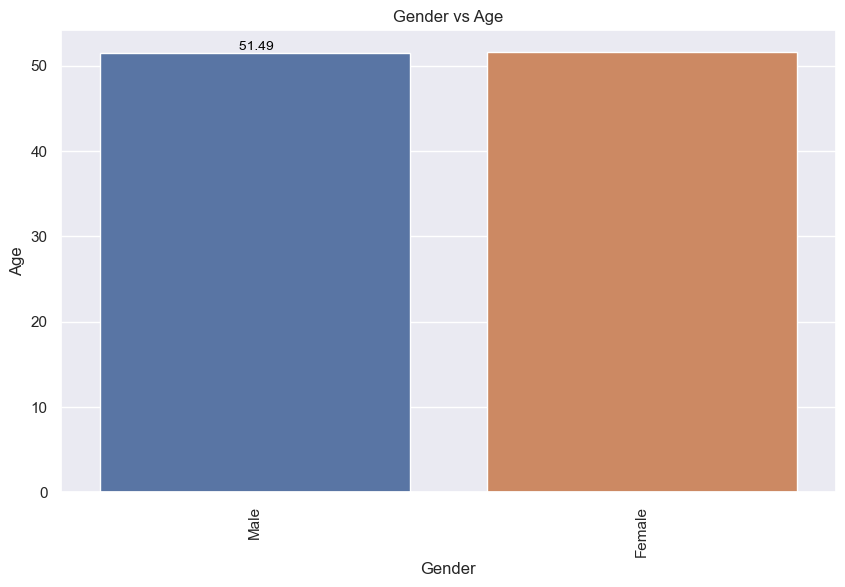

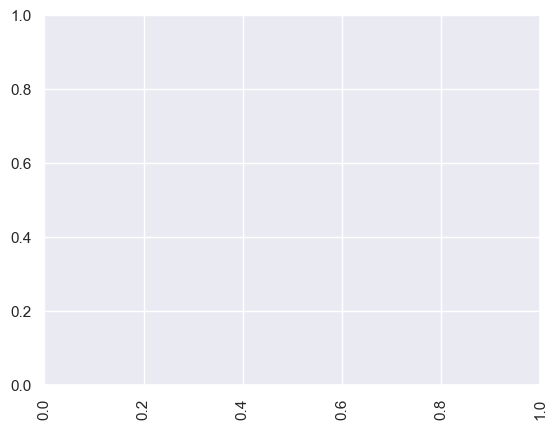

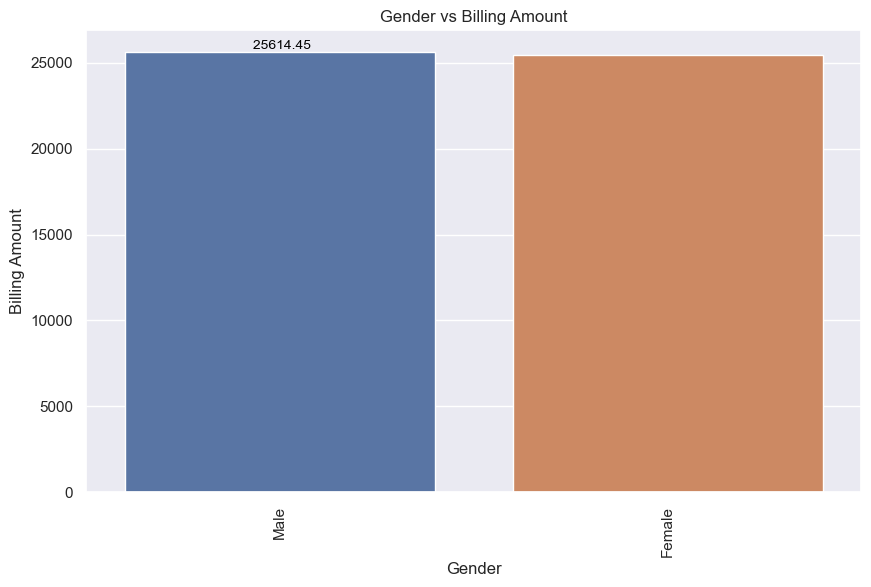

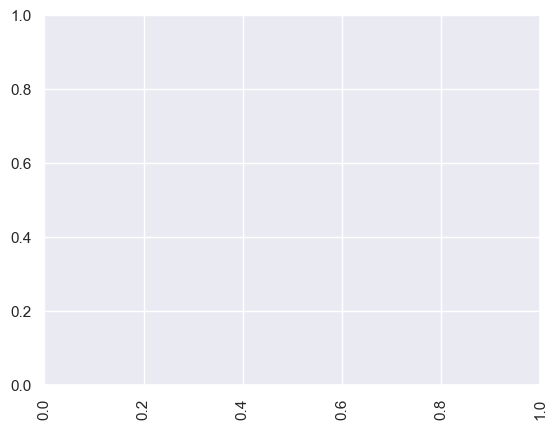

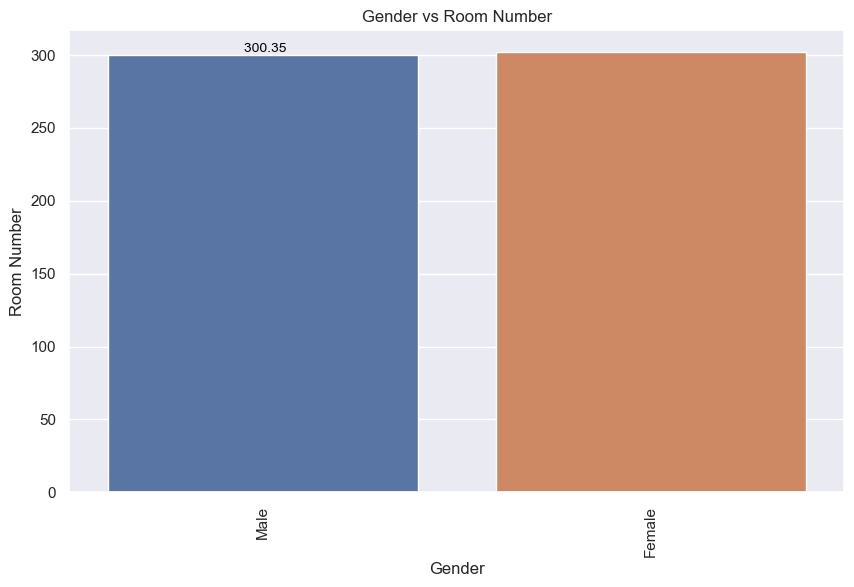

...

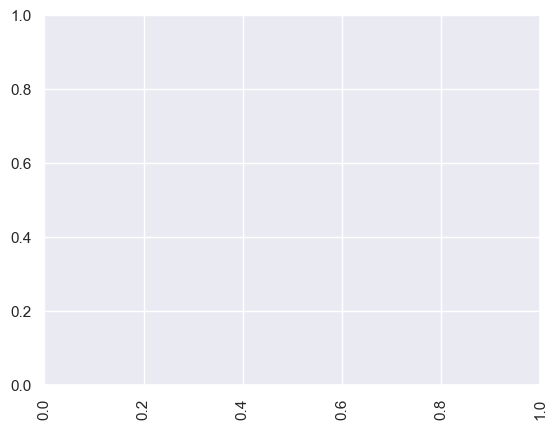

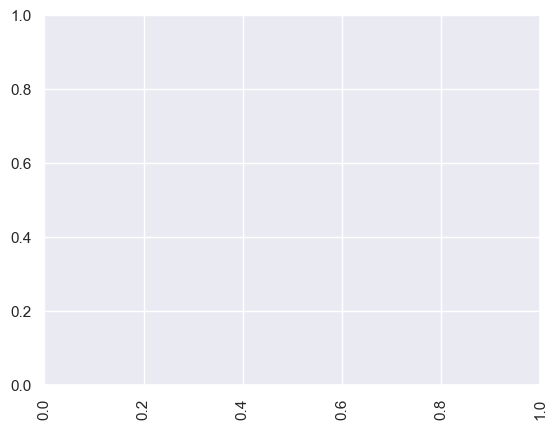

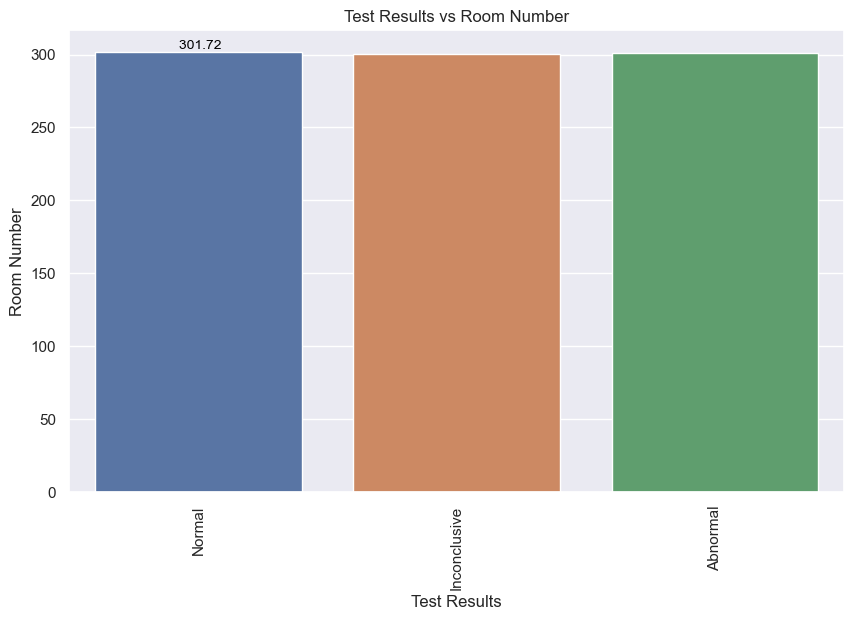

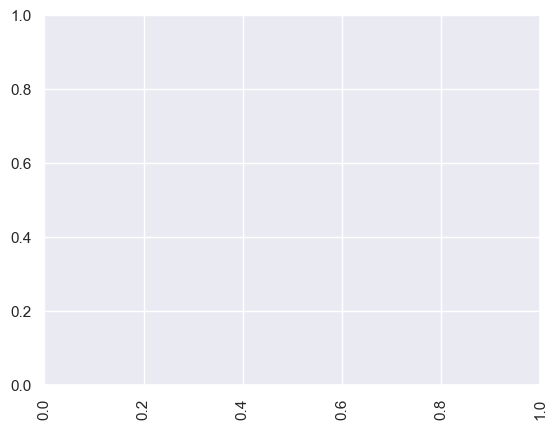

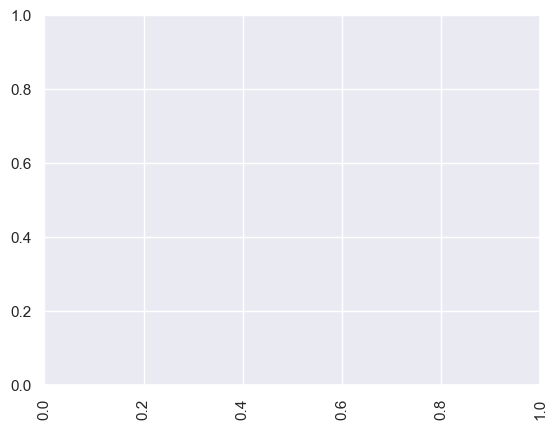

In [47]:
# Bivariate Analysis
for dis in categorical:
    for cont in continuous:
        plt.figure(figsize=(10,6))
        ax = sns.barplot(data=df, x=dis, y=cont, ci= None)
        plt.title(f'{dis} vs {cont}')
        
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f"{height: .2f}", 
                    (p.get_x() + p.get_width() / 2., height), 
                    ha="center", va="bottom", fontsize=10, color='black', rotation=0)
            plt.xticks(rotation=90)
            plt.show()

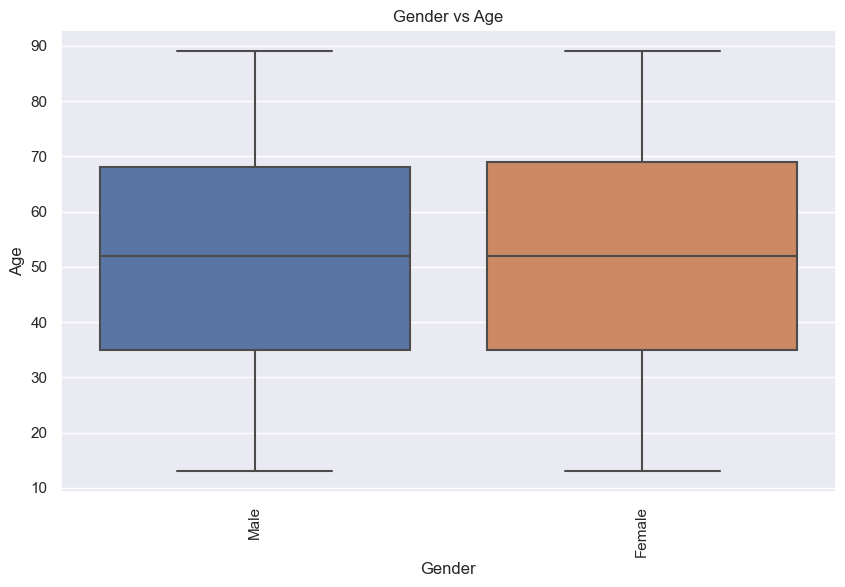

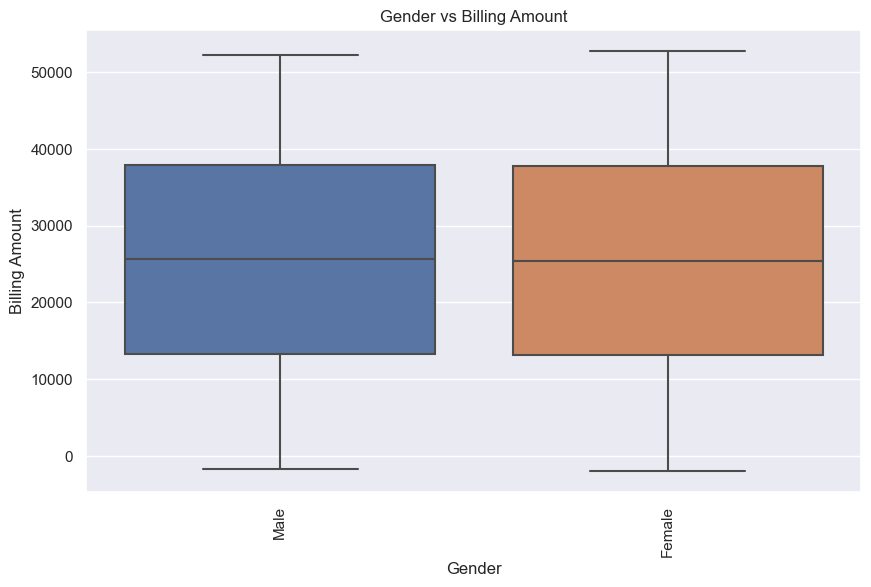

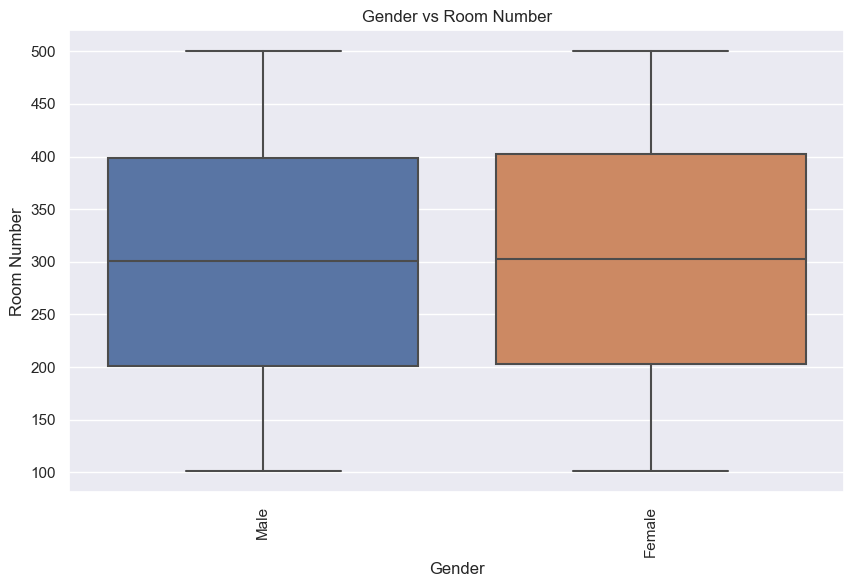

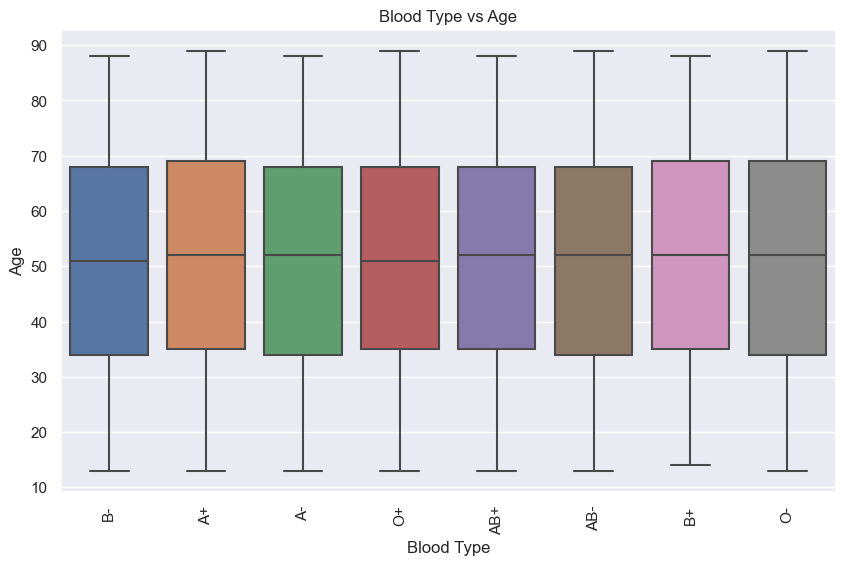

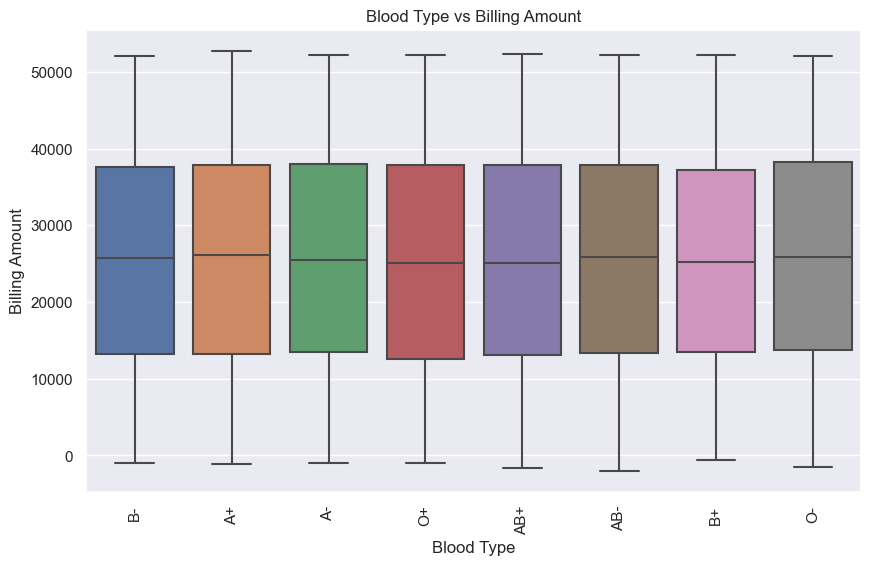

...

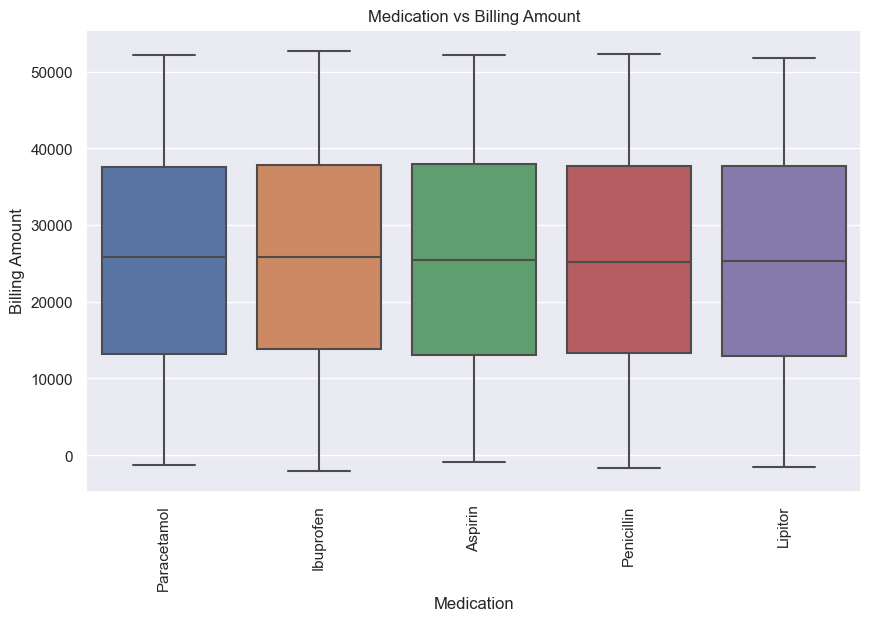

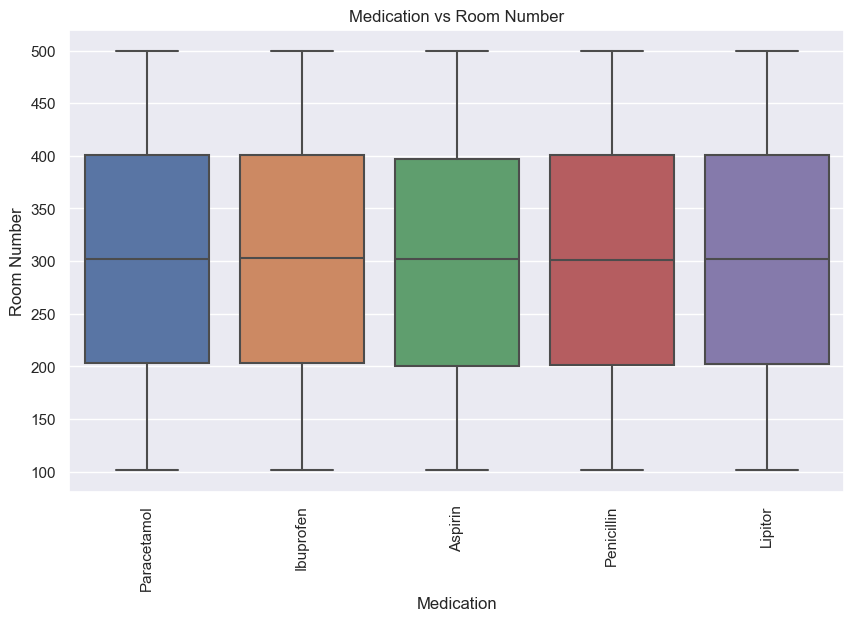

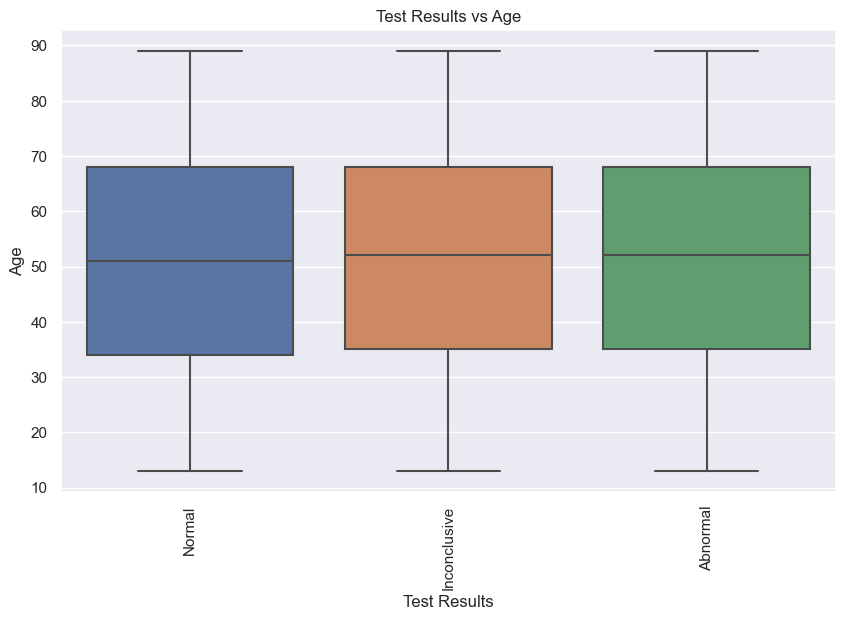

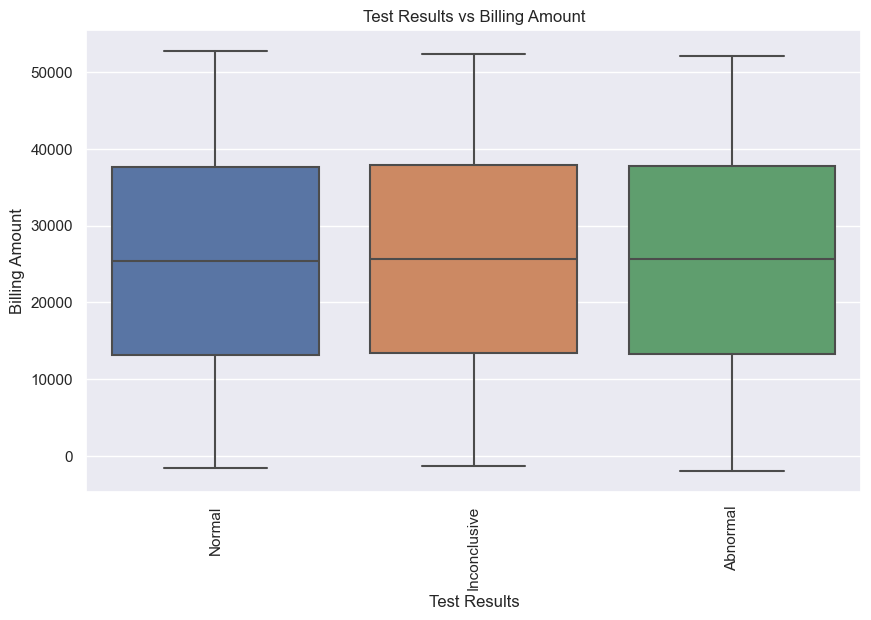

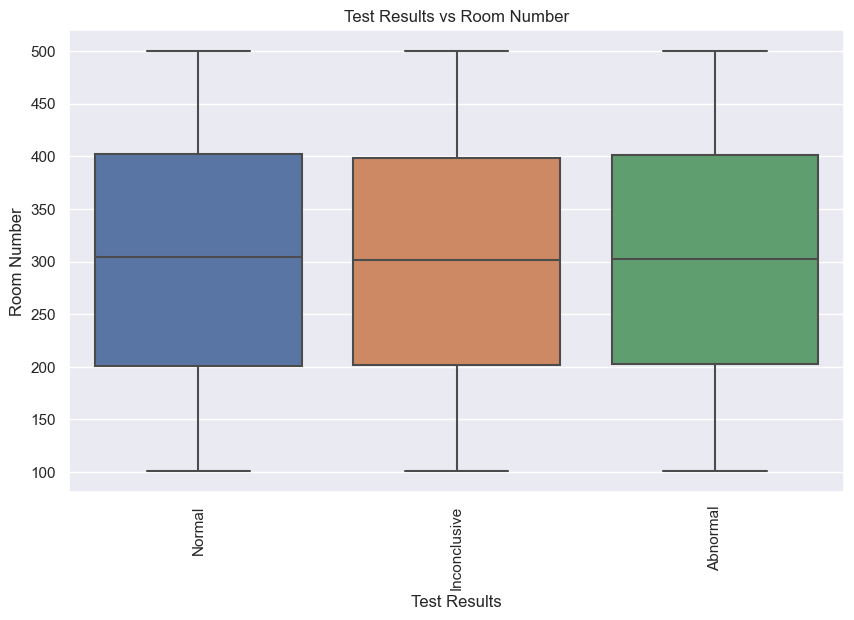

In [48]:
for dis in categorical:
    for cont in continuous:
        plt.figure(figsize=(10,6))
        ax = sns.boxplot(data=df,x=dis, y=cont)
        plt.title(f"{dis} vs {cont}")
        plt.xticks(rotation=90)
        plt.show()

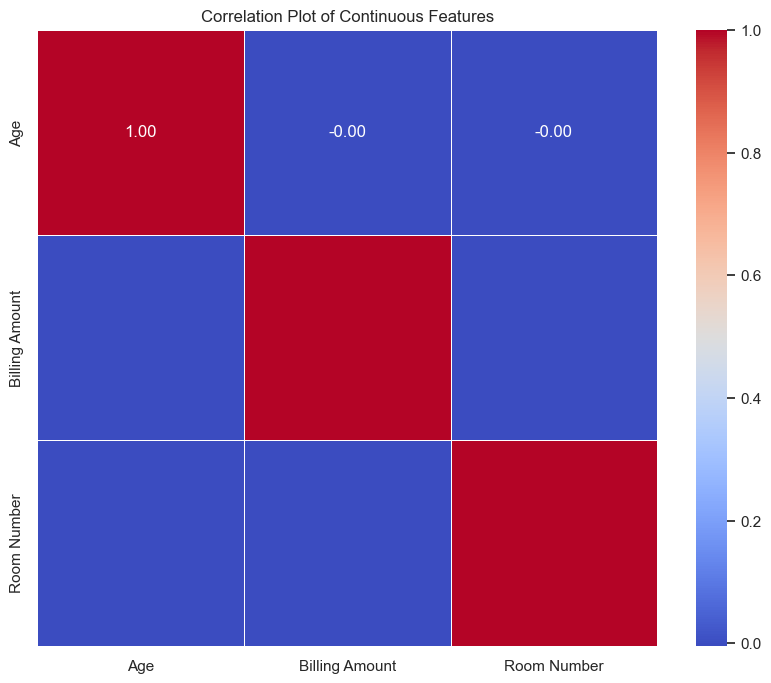

In [50]:
corr_matrix = df[continuous].corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths = 0.5)
plt.title("Correlation Plot of Continuous Features")
plt.show()

In [51]:
corr_matrix

,Age,Billing Amount,Room Number
Age,1.000000,-0.003427,-0.000352
Billing Amount,-0.003427,1.000000,-0.003930
Room Number,-0.000352,-0.003930,1.000000


In [52]:
from scipy.stats import f_oneway
f_stat, p_val = f_oneway(df[df['Gender'] == 'Male']['Billing Amount'],
                         df[df['Gender']== 'Female']['Billing Amount'])
print(f"ANOVA Result: F-statistic = {f_stat}, p-value = {p_val}")

ANOVA Result: F-statistic = 1.3408137448241757, p-value = 0.24689554515167283


In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [54]:
df['Medical Condition'].unique()

array(['Cancer', 'Obesity', 'Diabetes', 'Asthma', 'Hypertension',
       'Arthritis'], dtype=object)

In [56]:
df['Admission Type'].unique()

array(['Urgent', 'Emergency', 'Elective'], dtype=object)

In [57]:
# Categorical vs Categorical analysis
# as Medical Condition and Admission Type both are categorical type variables
# Stats to be done = Chi Square Test

from scipy.stats import chi2_contingency
contingency_table = pd.crosstab(df['Admission Type'], df['Medical Condition'])
contingency_table

Medical Condition,Arthritis,Asthma,Cancer,Diabetes,Hypertension,Obesity
Admission Type,,,,,,
Elective,3062,3069,3114,3031,3182,3015
Emergency,3073,2978,2988,2988,2975,3100
Urgent,3083,3048,3038,3197,2994,3031


In [58]:
chi2, p, dof, ex = chi2_contingency(contingency_table)
print(f"chi-square Test Result : chi2={chi2}, p-value={p}")

chi-square Test Result : chi2=17.8903466905814, p-value=0.05684174826535973


In [60]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

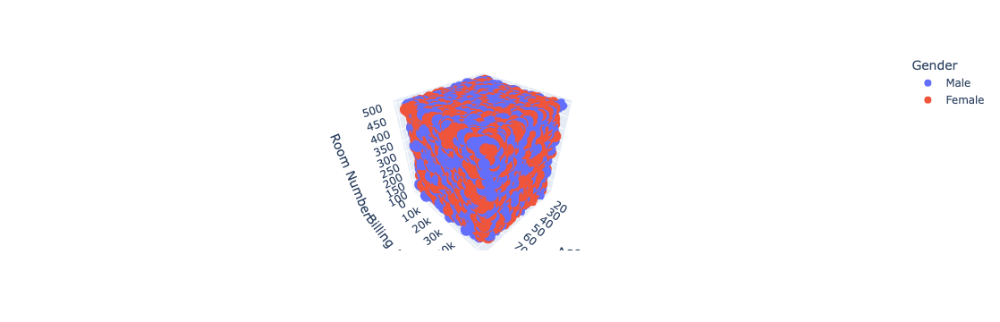

In [61]:
fig = px.scatter_3d(df, x='Age', y='Billing Amount', z='Room Number', color='Gender')
fig.show()

In [62]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [63]:
# Anova test between Gender and Blood Type

from scipy.stats import f_oneway
f_stat, p_val = f_oneway(df[df['Gender'] == 'Male']['Room Number'],
                         df[df['Gender']== 'Female']['Room Number'])
print(f"ANOVA Result: F-statistic = {f_stat}, p-value = {p_val}")

ANOVA Result: F-statistic = 2.515141674976748, p-value = 0.11276325182244697


In [64]:
from scipy.stats import chi2_contingency
contingency_table2 = pd.crosstab(df['Admission Type'], df['Test Results'])
contingency_table2

Test Results,Abnormal,Inconclusive,Normal
Admission Type,,,
Elective,6232,6054,6187
Emergency,6038,6020,6044
Urgent,6167,6124,6100


In [65]:
chi2, p, dof, ex = chi2_contingency(contingency_table2)
print(f"chi-square Test Result : chi2={chi2}, p-value={p}")

chi-square Test Result : chi2=1.6483544800315115, p-value=0.8000762990710856


In [66]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [67]:
pivot_table = pd.pivot_table(df, values = ['Age', 'Billing Amount'],
                            index = ['Gender', 'Medical Condition', 'Admission Type'],
                            aggfunc = { 'Billing Amount': 'mean', 'Age': 'mean'})
pivot_table

Age  Billing Amount
Gender Medical Condition Admission Type                           
Female Arthritis         Elective        50.254990    25414.144607
                         Emergency       51.998072    25036.389922
                         Urgent          51.994129    25564.679900
       Asthma            Elective        51.147573    25490.918214
                         Emergency       51.568047    25468.207193
                         Urgent          52.420761    25101.857316
       Cancer            Elective        52.092208    25312.309738
                         Emergency       50.736944    25097.513220
                         Urgent          51.152542    25451.511538
       Diabetes          Elective        51.024918    25709.493051
                         Emergency       51.980731    25565.425113
                         Urgent          51.797973    25404.787550
       Hypertension      Elective        52.416406    25529.889579
                         Emergency       51.614353    25118.920307
                         Urgent          52.363268    25650.239969
       Obesity           Elective        52.106509    25465.834357
                         Emergency       51.024643    26392.463194
                         Urgent          50.866225    25746.819797
Male   Arthritis         Elective        51.591120    25546.952631
                         Emergency       51.445616    25969.665058
                         Urgent          51.963871    25552.155465
       Asthma            Elective        51.488845    25013.631482
                         Emergency       52.054907    26337.884796
                         Urgent          50.992514    26355.873985
       Cancer            Elective        51.183609    26023.609166
                         Emergency       52.953375    24618.664505
                         Urgent          51.230326    24379.955530
       Diabetes          Elective        51.297477    26358.827134
                         Emergency       51.469993    25376.403502
                         Urgent          51.891842    25562.589495
       Hypertension      Elective        50.913565    25580.478874
                         Emergency       50.720350    25825.482969
                         Urgent          52.272307    25311.874010
       Obesity           Elective        51.711513    25913.641197
                         Emergency       51.019897    25254.517370
                         Urgent          50.684418    26059.675047

In [68]:
pivot_table_sum = pd.pivot_table(df, values = [ 'Billing Amount'],
                            index = ['Insurance Provider', 'Test Results'],
                            aggfunc = 'sum', margins=True)
pivot_table_sum

Billing Amount
Insurance Provider Test Results                
Aetna              Abnormal        9.171489e+07
                   Inconclusive    9.330576e+07
                   Normal          9.147809e+07
Blue Cross         Abnormal        9.248506e+07
                   Inconclusive    9.548302e+07
                   Normal          9.244101e+07
Cigna              Abnormal        9.562466e+07
                   Inconclusive    9.488665e+07
                   Normal          9.382279e+07
Medicare           Abnormal        9.634342e+07
                   Inconclusive    9.258157e+07
                   Normal          9.398603e+07
UnitedHealthcare   Abnormal        9.478735e+07
                   Inconclusive    9.029127e+07
                   Normal          9.483675e+07
All                                1.404068e+09

In [69]:
pivot_table_multi = pd.pivot_table(df, values = [ 'Billing Amount'],
                            index = ['Medical Condition', 'Gender'],
                            aggfunc = ['sum','mean','count','min', 'max'], margins=True)
pivot_table_multi

sum           mean          count  \
                         Billing Amount Billing Amount Billing Amount   
Medical Condition Gender                                                
Arthritis         Female   1.176154e+08   25337.234722           4642   
                  Male     1.175522e+08   25688.849297           4576   
Asthma            Female   1.143928e+08   25358.633474           4511   
                  Male     1.187435e+08   25903.913291           4584   
Cancer            Female   1.154482e+08   25284.314393           4566   
                  Male     1.144441e+08   25020.562355           4574   
Diabetes          Female   1.177971e+08   25558.060586           4609   
                  Male     1.186899e+08   25762.941146           4607   
Hypertension      Female   1.162115e+08   25434.788625           4569   
                  Male     1.171669e+08   25571.135120           4582   
Obesity           Female   1.183084e+08   25871.071549           4573   
                  Male     1.176983e+08   25737.652254           4573   
All                        1.404068e+09   25544.306284          54966   

                                    min            max  
                         Billing Amount Billing Amount  
Medical Condition Gender                                
Arthritis         Female    -964.798619   52170.036854  
                  Male     -1129.997176   51975.968135  
Asthma            Female   -1306.662189   52181.837792  
                  Male     -1520.420555   51336.221210  
Cancer            Female   -2008.492140   52373.032374  
                  Male     -1277.645337   52092.669896  
Diabetes          Female    -860.617987   52211.852966  
                  Male     -1316.618581   51848.201597  
Hypertension      Female    -652.181369   52764.276736  
                  Male     -1660.009373   52271.663747  
Obesity           Female    -967.594706   51501.649773  
                  Male     -1310.272895   52024.726443  
All                        -2008.492140   52764.276736

In [70]:
Group_data = df.groupby(['Gender','Medical Condition'])[['Billing Amount', 'Age']].mean()
Group_data

Billing Amount        Age
Gender Medical Condition                           
Female Arthritis            25337.234722  51.413615
       Asthma               25358.633474  51.697185
       Cancer               25284.314393  51.328296
       Diabetes             25558.060586  51.601866
       Hypertension         25434.788625  52.137448
       Obesity              25871.071549  51.332167
Male   Arthritis            25688.849297  51.669143
       Asthma               25903.913291  51.495201
       Cancer               25020.562355  51.755575
       Diabetes             25762.941146  51.561754
       Hypertension         25571.135120  51.299651
       Obesity              25737.652254  51.134266

In [71]:
group_data_custom = df.groupby('Admission Type') ['Billing Amount'].agg([('median','median'),
                               ('Standard Deviation','std')])
group_data_custom

,median,Standard Deviation
Admission Type,,
Elective,25674.735365,14220.835323
Emergency,25413.781043,14159.764673
Urgent,25543.558472,14244.202912


In [72]:
df.columns

Index(['Name', 'Age', 'Gender', 'Blood Type', 'Medical Condition',
       'Date of Admission', 'Doctor', 'Hospital', 'Insurance Provider',
       'Billing Amount', 'Room Number', 'Admission Type', 'Discharge Date',
       'Medication', 'Test Results'],
      dtype='object')

In [75]:
group_datas = df.groupby(['Date of Admission', 'Blood Type', 'Discharge Date'])['Billing Amount'].agg([('Mean', 'mean'),
                        ('Median','median')])
group_datas

Mean        Median
Date of Admission Blood Type Discharge Date                            
2019-05-08        A+         2019-05-31      34181.759815  34181.759815
                  A-         2019-05-09      28631.502116  28631.502116
                             2019-05-15      12090.525600  12090.525600
                             2019-06-03      18802.678609  18802.678609
                  AB+        2019-05-28      23249.431964  23249.431964
...                                                   ...           ...
2024-05-07        O+         2024-06-03      31365.278295  31365.278295
                  O-         2024-05-08      10676.935383  10676.935383
                             2024-05-19      41751.109647  41751.109647
                             2024-05-28      27398.670770  27398.670770
                             2024-06-01      26491.475683  26491.475683

[47220 rows x 2 columns]

<Axes: xlabel='Admission Type'>

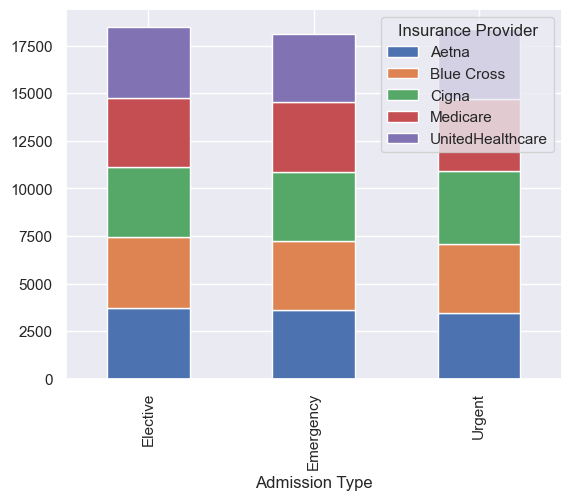

In [77]:
pd.crosstab(df['Admission Type'], df['Insurance Provider']).plot(kind ='bar', stacked=True)

<Axes: xlabel='Insurance Provider'>

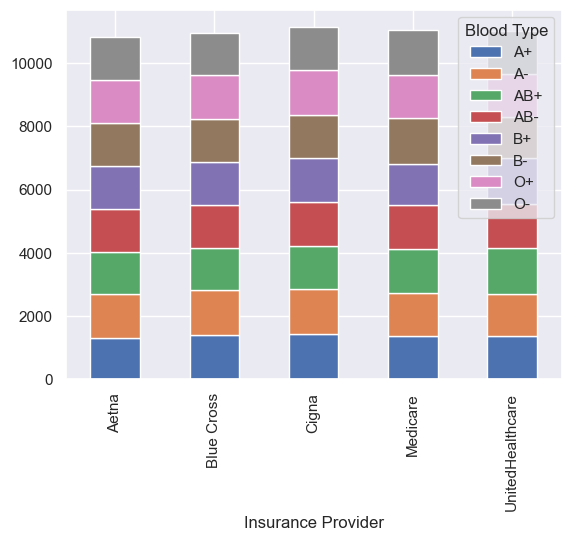

In [78]:
pd.crosstab(df['Insurance Provider'], df['Blood Type'], values=df['Hospital'], aggfunc='count').plot(kind='bar', stacked=True)


In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Name                54966 non-null  object 
 1   Age                 54966 non-null  int64  
 2   Gender              54966 non-null  object 
 3   Blood Type          54966 non-null  object 
 4   Medical Condition   54966 non-null  object 
 5   Date of Admission   54966 non-null  object 
 6   Doctor              54966 non-null  object 
 7   Hospital            54966 non-null  object 
 8   Insurance Provider  54966 non-null  object 
 9   Billing Amount      54966 non-null  float64
 10  Room Number         54966 non-null  int64  
 11  Admission Type      54966 non-null  object 
 12  Discharge Date      54966 non-null  object 
 13  Medication          54966 non-null  object 
 14  Test Results        54966 non-null  object 
dtypes: float64(1), int64(2), object(12)
memory usage: 6.7+ MB


In [80]:
df['Date of Admission'] = pd.to_datetime(df['Date of Admission'])

In [81]:
df['Discharge Date'] = pd.to_datetime(df['Discharge Date'])

In [82]:
# Data Augmentation

df['Admission Day'] = df['Date of Admission'].dt.day
df['Admission Month'] = df['Date of Admission'].dt.month
df['Admission Year'] = df['Date of Admission'].dt.year

In [83]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal,22,9,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022


In [84]:
df.head(50)

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,Room Number,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,328,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,265,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,205,Emergency,2022-10-07,Aspirin,Normal,22,9,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,450,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,458,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022
5,EMILY JOHNSOn,36,Male,A+,Asthma,2023-12-20,Taylor Newton,Nunez-Humphrey,UnitedHealthcare,48145.110951,389,Urgent,2023-12-24,Ibuprofen,Normal,20,12,2023
6,edwArD EDWaRDs,21,Female,AB-,Diabetes,2020-11-03,Kelly Olson,Group Middleton,Medicare,19580.872345,389,Emergency,2020-11-15,Paracetamol,Inconclusive,3,11,2020
7,CHrisTInA MARtinez,20,Female,A+,Cancer,2021-12-28,Suzanne Thomas,"Powell Robinson and Valdez,",Cigna,45820.462722,277,Emergency,2022-01-07,Paracetamol,Inconclusive,28,12,2021
8,JASmINe aGuIlaR,82,Male,AB+,Asthma,2020-07-01,Daniel Ferguson,Sons Rich and,Cigna,50119.222792,316,Elective,2020-07-14,Aspirin,Abnormal,1,7,2020
9,ChRISTopher BerG,58,Female,AB-,Cancer,2021-05-23,Heather Day,Padilla-Walker,UnitedHealthcare,19784.631062,249,Elective,2021-06-22,Paracetamol,Inconclusive,23,5,2021


In [85]:
df['Discharge Day'] = df['Discharge Date'].dt.day
df['Discharge Month'] = df['Discharge Date'].dt.month
df['Discharge Year'] = df['Discharge Date'].dt.year

In [86]:
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,...,Admission Type,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharge Month,Discharge Year
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,...,Urgent,2024-02-02,Paracetamol,Normal,31,1,2024,2,2,2024
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,...,Emergency,2019-08-26,Ibuprofen,Inconclusive,20,8,2019,26,8,2019
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,...,Emergency,2022-10-07,Aspirin,Normal,22,9,2022,7,10,2022
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,...,Elective,2020-12-18,Ibuprofen,Abnormal,18,11,2020,18,12,2020
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,...,Urgent,2022-10-09,Penicillin,Abnormal,19,9,2022,9,10,2022


In [87]:
df['Days'] = df['Discharge Date'] - df['Date of Admission']
df.head()

,Name,Age,Gender,Blood Type,Medical Condition,Date of Admission,Doctor,Hospital,Insurance Provider,Billing Amount,...,Discharge Date,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharge Month,Discharge Year,Days
0,Bobby JacksOn,30,Male,B-,Cancer,2024-01-31,Matthew Smith,Sons and Miller,Blue Cross,18856.281306,...,2024-02-02,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,LesLie TErRy,62,Male,A+,Obesity,2019-08-20,Samantha Davies,Kim Inc,Medicare,33643.327287,...,2019-08-26,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,DaNnY sMitH,76,Female,A-,Obesity,2022-09-22,Tiffany Mitchell,Cook PLC,Aetna,27955.096079,...,2022-10-07,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,andrEw waTtS,28,Female,O+,Diabetes,2020-11-18,Kevin Wells,"Hernandez Rogers and Vang,",Medicare,37909.782410,...,2020-12-18,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,adrIENNE bEll,43,Female,AB+,Cancer,2022-09-19,Kathleen Hanna,White-White,Aetna,14238.317814,...,2022-10-09,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [88]:
df = df.drop(['Name','Date of Admission','Doctor','Hospital','Insurance Provider',
            'Room Number','Discharge Date'], axis = 1)

In [89]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Billing Amount,Admission Type,Medication,Test Results,Admission Day,Admission Month,Admission Year,Discharge Day,Discharge Month,Discharge Year,Days
0,30,Male,B-,Cancer,18856.281306,Urgent,Paracetamol,Normal,31,1,2024,2,2,2024,2 days
1,62,Male,A+,Obesity,33643.327287,Emergency,Ibuprofen,Inconclusive,20,8,2019,26,8,2019,6 days
2,76,Female,A-,Obesity,27955.096079,Emergency,Aspirin,Normal,22,9,2022,7,10,2022,15 days
3,28,Female,O+,Diabetes,37909.782410,Elective,Ibuprofen,Abnormal,18,11,2020,18,12,2020,30 days
4,43,Female,AB+,Cancer,14238.317814,Urgent,Penicillin,Abnormal,19,9,2022,9,10,2022,20 days


In [90]:
df.columns

Index(['Age', 'Gender', 'Blood Type', 'Medical Condition', 'Billing Amount',
       'Admission Type', 'Medication', 'Test Results', 'Admission Day',
       'Admission Month', 'Admission Year', 'Discharge Day', 'Discharge Month',
       'Discharge Year', 'Days'],
      dtype='object')

In [91]:
# Problem statement : Prdictive Modeling of Healthcare solving Multi-Class Classification Problem whwre thw target is the Test Results
# Will test result decide the Billing Amount? No
# So Billing Amount though generated at last we need to solve using Test Result so 'Billing Amount' is also should be dropped

df = df.drop(['Billing Amount','Admission Day',
       'Admission Month', 'Admission Year','Discharge Day', 'Discharge Month',
       'Discharge Year'], axis = 1)
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2 days
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6 days
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15 days
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30 days
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20 days


In [92]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 54966 entries, 0 to 55499
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   Age                54966 non-null  int64          
 1   Gender             54966 non-null  object         
 2   Blood Type         54966 non-null  object         
 3   Medical Condition  54966 non-null  object         
 4   Admission Type     54966 non-null  object         
 5   Medication         54966 non-null  object         
 6   Test Results       54966 non-null  object         
 7   Days               54966 non-null  timedelta64[ns]
dtypes: int64(1), object(6), timedelta64[ns](1)
memory usage: 3.8+ MB


In [93]:
df['Days'] = df['Days'].astype(str)
df['Days_Numeric'] = df['Days'].str.split().str[0].astype(int)

In [94]:
df = df.drop(['Days'], axis = 1)

In [95]:
df.head()

,Age,Gender,Blood Type,Medical Condition,Admission Type,Medication,Test Results,Days_Numeric
0,30,Male,B-,Cancer,Urgent,Paracetamol,Normal,2
1,62,Male,A+,Obesity,Emergency,Ibuprofen,Inconclusive,6
2,76,Female,A-,Obesity,Emergency,Aspirin,Normal,15
3,28,Female,O+,Diabetes,Elective,Ibuprofen,Abnormal,30
4,43,Female,AB+,Cancer,Urgent,Penicillin,Abnormal,20


In [96]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [97]:
df.columns

Index(['Age', 'Gender', 'Blood Type', 'Medical Condition', 'Admission Type',
       'Medication', 'Test Results', 'Days_Numeric'],
      dtype='object')

In [98]:
print("Categorical Features: ", categorical)
print("*****************")
print("Non Categorical Features: ", non_categorical)
print("*****************")
print("Discrete Features: ", discrete)
print("*****************")
print("Continuous Features: ", continuous)
print("*****************")

Categorical Features:  ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication', 'Test Results']
*****************
Non Categorical Features:  []
*****************
Discrete Features:  []
*****************
Continuous Features:  ['Age', 'Days_Numeric']
*****************


In [99]:
categorical_features = ['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']
# Test Result cannot be considered as Categorical Features as it is Target Variable according to Problem Statement.
categorical_features

['Gender', 'Blood Type', 'Medical Condition', 'Admission Type', 'Medication']

In [100]:
df_dummies = pd.get_dummies(df[categorical_features], drop_first=True)

In [101]:
df_dummies = df_dummies.replace({True: 1, False: 0})

In [102]:
df = pd.concat([df.drop(columns=categorical_features),df_dummies], axis=1)

In [103]:
df.head()

,Age,Test Results,Days_Numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,Normal,2,1,0,0,0,0,1,0,...,1,0,0,0,0,1,0,0,1,0
1,62,Inconclusive,6,1,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
2,76,Normal,15,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,28,Abnormal,30,0,0,0,0,0,0,1,...,0,1,0,0,0,0,1,0,0,0
4,43,Abnormal,20,0,0,1,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1


In [104]:
df.columns

Index(['Age', 'Test Results', 'Days_Numeric', 'Gender_Male', 'Blood Type_A-',
       'Blood Type_AB+', 'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-',
       'Blood Type_O+', 'Blood Type_O-', 'Medical Condition_Asthma',
       'Medical Condition_Cancer', 'Medical Condition_Diabetes',
       'Medical Condition_Hypertension', 'Medical Condition_Obesity',
       'Admission Type_Emergency', 'Admission Type_Urgent',
       'Medication_Ibuprofen', 'Medication_Lipitor', 'Medication_Paracetamol',
       'Medication_Penicillin'],
      dtype='object')

In [105]:
df.columns

Index(['Age', 'Test Results', 'Days_Numeric', 'Gender_Male', 'Blood Type_A-',
       'Blood Type_AB+', 'Blood Type_AB-', 'Blood Type_B+', 'Blood Type_B-',
       'Blood Type_O+', 'Blood Type_O-', 'Medical Condition_Asthma',
       'Medical Condition_Cancer', 'Medical Condition_Diabetes',
       'Medical Condition_Hypertension', 'Medical Condition_Obesity',
       'Admission Type_Emergency', 'Admission Type_Urgent',
       'Medication_Ibuprofen', 'Medication_Lipitor', 'Medication_Paracetamol',
       'Medication_Penicillin'],
      dtype='object')

In [106]:
test_result_mapping={'Normal':0, 'Abnormal':1, 'Inconclusive':2}

In [107]:
test_result_mapping

{'Normal': 0, 'Abnormal': 1, 'Inconclusive': 2}

In [108]:
df['Test_Results_Numeric'] = df['Test Results'].replace(test_result_mapping)

In [109]:
df.head()

,Age,Test Results,Days_Numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,...,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test_Results_Numeric
0,30,Normal,2,1,0,0,0,0,1,0,...,0,0,0,0,1,0,0,1,0,0
1,62,Inconclusive,6,1,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,2
2,76,Normal,15,0,1,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,28,Abnormal,30,0,0,0,0,0,0,1,...,1,0,0,0,0,1,0,0,0,1
4,43,Abnormal,20,0,0,1,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


In [110]:
df = df.drop(['Test Results'], axis=1)

In [111]:
df.head()

,Age,Days_Numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin,Test_Results_Numeric
0,30,2,1,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,1,0,0
1,62,6,1,0,0,0,0,0,0,0,...,0,0,1,1,0,1,0,0,0,2
2,76,15,0,1,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0
3,28,30,0,0,0,0,0,0,1,0,...,1,0,0,0,0,1,0,0,0,1
4,43,20,0,0,1,0,0,0,0,0,...,0,0,0,0,1,0,0,0,1,1


In [112]:
df['Age'].describe()

count    54966.000000
mean        51.535185
std         19.605661
min         13.000000
25%         35.000000
50%         52.000000
75%         68.000000
max         89.000000
Name: Age, dtype: float64

In [113]:
df['Days_Numeric'].describe()

count    54966.000000
mean        15.499290
std          8.661471
min          1.000000
25%          8.000000
50%         15.000000
75%         23.000000
max         30.000000
Name: Days_Numeric, dtype: float64

In [114]:
# Feature Scaling is needed or not? Not as its classification problem.

In [115]:
# Split into dependent variable and independent variable
x = df.drop('Test_Results_Numeric', axis=1)
x.head()

,Age,Days_Numeric,Gender_Male,Blood Type_A-,Blood Type_AB+,Blood Type_AB-,Blood Type_B+,Blood Type_B-,Blood Type_O+,Blood Type_O-,...,Medical Condition_Cancer,Medical Condition_Diabetes,Medical Condition_Hypertension,Medical Condition_Obesity,Admission Type_Emergency,Admission Type_Urgent,Medication_Ibuprofen,Medication_Lipitor,Medication_Paracetamol,Medication_Penicillin
0,30,2,1,0,0,0,0,1,0,0,...,1,0,0,0,0,1,0,0,1,0
1,62,6,1,0,0,0,0,0,0,0,...,0,0,0,1,1,0,1,0,0,0
2,76,15,0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,28,30,0,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,0
4,43,20,0,0,1,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,1


In [116]:
y = df['Test_Results_Numeric']
y.head()

0    0
1    2
2    0
3    1
4    1
Name: Test_Results_Numeric, dtype: int64

In [117]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42, stratify = y)

In [118]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix

In [119]:
lr_model = LogisticRegression()
lr_model.fit(x_train, y_train)

LogisticRegression()

In [120]:
y_pred =lr_model.predict(x_test)

In [121]:
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test,y_pred)
print(f"Accuracy{accuracy:.2f}")
print("Classification Report :")
print(report)

Accuracy0.34
Classification Report :
              precision    recall  f1-score   support

           0       0.34      0.36      0.35      3666
           1       0.34      0.39      0.36      3688
           2       0.34      0.27      0.30      3640

    accuracy                           0.34     10994
   macro avg       0.34      0.34      0.34     10994
weighted avg       0.34      0.34      0.34     10994



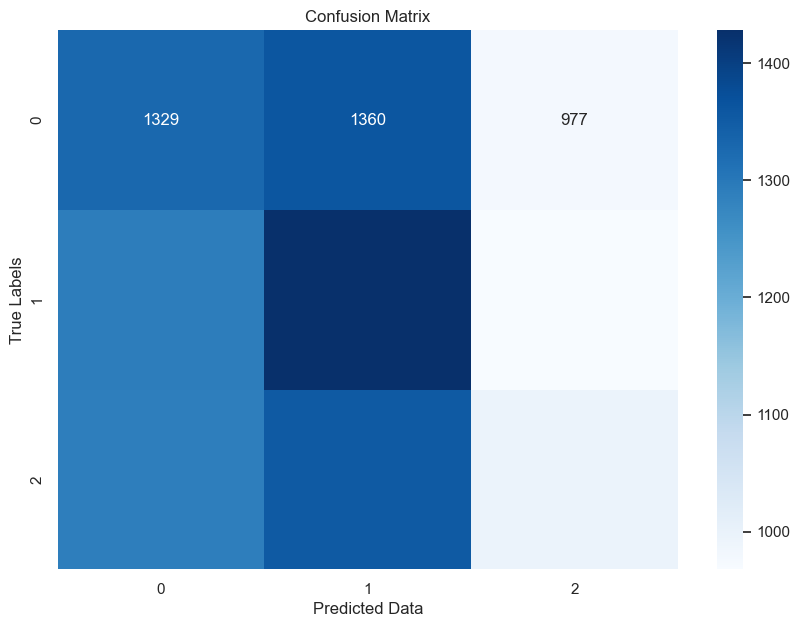

In [122]:
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel("Predicted Data")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


In [123]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [124]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

In [125]:
y_pred_dt = dt_model.predict(x_test)

In [126]:
accuracy = accuracy_score(y_test, y_pred_dt)
report = classification_report(y_test,y_pred_dt)
print(f"Accuracy{accuracy:.2f}")
print("Classification Report :")
print(report)

Accuracy0.36
Classification Report :
              precision    recall  f1-score   support

           0       0.36      0.36      0.36      3666
           1       0.35      0.36      0.35      3688
           2       0.36      0.36      0.36      3640

    accuracy                           0.36     10994
   macro avg       0.36      0.36      0.36     10994
weighted avg       0.36      0.36      0.36     10994



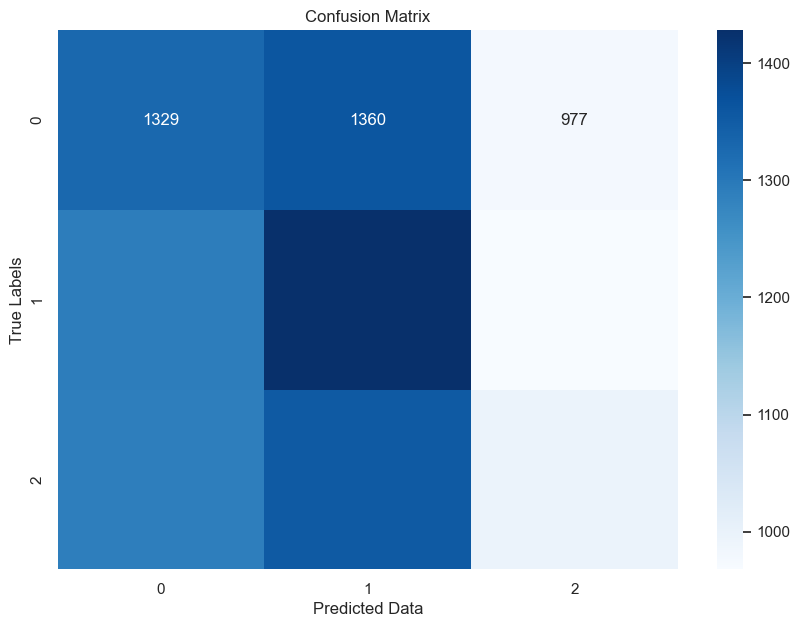

In [128]:
plt.figure(figsize=(10,7))
sns.heatmap(confusion_matrix(y_test,y_pred), annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_test), yticklabels=np.unique(y_test))
plt.xlabel("Predicted Data")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()


In [129]:
rf_model = RandomForestClassifier()
rf_model.fit(x_train,y_train)

RandomForestClassifier()

In [130]:
y_pred_rf = rf_model.predict(x_test)

In [131]:
accuracy = accuracy_score(y_test, y_test)
report = classification_report(y_test, y_pred_rf)
print(f"Accuracy {accuracy:.2f}")
print("Classification Report :")
print(report)

Accuracy 1.00
Classification Report :
              precision    recall  f1-score   support

           0       0.41      0.42      0.41      3666
           1       0.42      0.42      0.42      3688
           2       0.40      0.40      0.40      3640

    accuracy                           0.41     10994
   macro avg       0.41      0.41      0.41     10994
weighted avg       0.41      0.41      0.41     10994



In [132]:
xg_model = XGBClassifier()
xg_model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [133]:
y_pred_xg = xg_model.predict(x_test)

In [134]:
accuracy = accuracy_score(y_test, y_test)
report = classification_report(y_test, y_pred_xg)
print(f"Accuracy {accuracy:.2f}")
print("Classification Report :")
print(report)

Accuracy 1.00
Classification Report :
              precision    recall  f1-score   support

           0       0.34      0.33      0.34      3666
           1       0.34      0.35      0.35      3688
           2       0.34      0.35      0.34      3640

    accuracy                           0.34     10994
   macro avg       0.34      0.34      0.34     10994
weighted avg       0.34      0.34      0.34     10994



In [148]:
# Deep Learning
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense

In [156]:
# Feature Scaling to perform deep learning
model = Sequential()
model.add(Dense(128, activation ='relu', input_shape=(x_train.shape[1],)))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='softmax'))
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                 │ (None, 128)            │         2,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,152 (51.38 KB)

 Trainable params: 13,152 (51.38 KB)

 Non-trainable params: 0 (0.00 B)

In [162]:
history = model.fit(x_train, y_train, epochs=10, batch_size=32, validation_data=(x_test, y_test))

Epoch 1/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 453us/step - accuracy: 0.3313 - loss: 1.2385 - val_accuracy: 0.3368 - val_loss: 1.1114
Epoch 2/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 405us/step - accuracy: 0.3276 - loss: 1.1266 - val_accuracy: 0.3361 - val_loss: 1.1183
Epoch 3/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 405us/step - accuracy: 0.3362 - loss: 1.1139 - val_accuracy: 0.3343 - val_loss: 1.1052
Epoch 4/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 471us/step - accuracy: 0.3392 - loss: 1.1079 - val_accuracy: 0.3348 - val_loss: 1.1128
Epoch 5/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 405us/step - accuracy: 0.3428 - loss: 1.1039 - val_accuracy: 0.3326 - val_loss: 1.1014
Epoch 6/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 407us/step - accuracy: 0.3352 - loss: 1.1018 - val_accuracy: 0.3288 - val_loss: 1.1012
Epoch 7/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 407us/step - accuracy: 0.3352 - loss: 1.1003 - val_accuracy: 0.3328 - val_loss: 1.0997
Epoch 8/10
1375/1375 ━━━━━━━━━━━━━━━━━━━━ 1s 411us/step - accuracy: 0.3344 -

In [166]:
import pickle
with open("logistic_regression_model_health.pkl", 'wb') as file:
    pickle.dump(lr_model,file)

In [3]:
with open('path_to_your_model_file.pkl', 'rb') as file:
    model = pickle.load(file)


FileNotFoundError: [Errno 2] No such file or directory: 'path_to_your_model_file.pkl'